# Bayesian generalized linear mixed effects model analysis

Dr. Harald Penasso<sup>1,2</sup><br>
<sup>1</sup>*Saphenus Medical Technology GmbH, Hauptplatz 9–13, 2500 Baden, Austria*<br>
<sup>2</sup>*Ludwig Boltzmann Institut für Experimentelle und Klinische Traumatologie, Donaueschingenstraße 13, 1200 Wien, Austria*

Email: harald.penasso@saphenus.com

Feb. 2023

_____

Analyzing the cross-over pilot study<br>
**Safety and Efficacy of Vibro-tactile Feedback for Patients who underwent Lower Limb Amputation**

**GitHub access:**
- View notebook and data: <br>
https://gitfront.io/r/haripen/6ZQ4pngRwEWa/Safety-Efficacy-vibrotactile-feedback-patients-lower-limb-amputation/
- View custom functions:<br>
https://gitfront.io/r/haripen/VwUFNvUqe1Pa/bambi-helper-funs/blob/bambi_helper_funs.py

In [1]:
# basic python
import pandas as pd
import numpy as np
from scipy import stats
import seaborn as sns
import matplotlib.pyplot as plt
# bayesian
import arviz as az
import pymc as pm
import bambi as bmb
import pymc as pm
# remote module import
import httpimport 
# pseudo random settings
random_seed = 1234
np.random.seed(random_seed)
# plot settings
sns.set(font_scale=1.1)
sns.set_style("white",{'axes.linewidth': 0.3})
plt.rcParams['xtick.bottom'] = True
plt.rcParams['ytick.left'] = True

In [2]:
myPackagePath = 'https://gitfront.io/r/haripen/VwUFNvUqe1Pa/bambi-helper-funs/raw/'
with httpimport.remote_repo(myPackagePath):
    #import bambi_helper_funs
    from bambi_helper_funs import prior_prob_BF,get_prior_probs,myROC, get_StanceT_Diff, az_plot_contrast, ppc_bambi, intersecti, seli, az_isel_scaled_value, bambi2idata4ppc, az_bf, intersect_two_dist, closest_value, az_effect_size, f_test, sns_to_hex, sort_dict_by_mean, summary_stats

In [3]:
def scaleback(t,df):
    s = df[df['test']==t].scaler.mean()
    if t == 'HealthVAS':
        s = s/10
        unit = ' [cm]'
        t_new = 'health VAS'
    elif t == 'WT2min':
        s = s/100
        unit = r' [$\times10^2$ m]'
        t_new = 'walk 2 min'
    elif t == 'TUG':
        unit = ' [s]'
        t_new = 'TUG'
    elif t == 'WT10m':
        unit = ' [s]'
        t_new = 'walk 10 m'
    elif t == 'FSST':
        unit = ' [s]'
        t_new = t 
    elif t == 'Velocity':
        unit = r' [km/h]'
        t_new = 'gait speed'
        s=s
    elif t == 'StanceTimeAL':
        unit = r' [$\times10^{-2}$ s]'
        t_new = 'stance time AL'
        s=s*10
    elif t == 'StepLengthUL':
        unit = r' [$\times10^1$ cm]'
        t_new = 'step length UL'
        s=s/10
    return s,unit,t_new

## Load data

In [4]:
# path to related remote repo
pn = 'https://gitfront.io/r/haripen/6ZQ4pngRwEWa/Safety-Efficacy-vibrotactile-feedback-patients-lower-limb-amputation/raw/data/'
# filename
fn = 'AllEffects_long.csv'
# load data
df = pd.read_csv(pn+fn,index_col=0)
# adjust data types
for cat in ['ID','sequence','tries','intervention','period','test']:
    df[cat] = df[cat].astype('category')
for flt in ['value','scaler','scaled_value']:
    df[flt] = df[flt].astype('float64')
# exclude 10m walk test
df = df[df['test']!='WT10m']
df

,ID,sequence,tries,value,intervention,period,test,scaler,scaled_value
0,1,VC,V1,-0.8700,V,1,FSST,-4.850907,0.179348
1,3,CV,V1,-1.9800,V,2,FSST,-4.850907,0.408171
2,4,VC,V1,-4.0000,V,1,FSST,-4.850907,0.824588
3,5,CV,V1,-0.7900,V,2,FSST,-4.850907,0.162856
4,6,VC,V1,-0.6900,V,1,FSST,-4.850907,0.142241
...,...,...,...,...,...,...,...,...,...
437,12,VC,V3,0.0792,C,2,Velocity,3.161367,0.025052
438,13,CV,V3,0.5184,C,1,Velocity,3.161367,0.163980
439,14,CV,V3,-0.9864,C,1,Velocity,3.161367,-0.312017
440,16,CV,V3,0.6480,C,1,Velocity,3.161367,0.204975


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 442 entries, 0 to 441
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   ID            442 non-null    category
 1   sequence      442 non-null    category
 2   tries         442 non-null    category
 3   value         442 non-null    float64 
 4   intervention  442 non-null    category
 5   period        442 non-null    category
 6   test          442 non-null    category
 7   scaler        442 non-null    float64 
 8   scaled_value  442 non-null    float64 
dtypes: category(6), float64(3)
memory usage: 17.9 KB


# Fit global model
- Run the model 3 times with differently ordering the fixed effects to have access to the posterior distributions of the vibration and control periods

In [6]:
global_formula_i =  "scaled_value ~ 0 + intervention + sequence + period + (1|ID:test)"
global_formula_s =  "scaled_value ~ 0 + sequence + intervention + period + (1|ID:test)"
global_formula_p =  "scaled_value ~ 0 + period + sequence + intervention + (1|ID:test)"

### Custom Priors

#### Normal mu = 0, sigma = 1

#### StudentT mu = 0, nu = 10

#### Cauchy alpha = 0, beta = 2

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [intervention, sequence, period, 1|ID:test_sigma, 1|ID:test_offset, scaled_value_sigma]


Sampling 8 chains for 2_100 tune and 4_000 draw iterations (16_800 + 32_000 draws total) took 27 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [sequence, intervention, period, 1|ID:test_sigma, 1|ID:test_offset, scaled_value_sigma]


Sampling 8 chains for 2_100 tune and 4_000 draw iterations (16_800 + 32_000 draws total) took 26 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [period, sequence, intervention, 1|ID:test_sigma, 1|ID:test_offset, scaled_value_sigma]


Sampling 8 chains for 2_100 tune and 4_000 draw iterations (16_800 + 32_000 draws total) took 25 seconds.
Sampling: [1|ID:test_offset, 1|ID:test_sigma, intervention, period, scaled_value, scaled_value_sigma, sequence]
Sampling: [1|ID:test_offset, 1|ID:test_sigma, intervention, period, scaled_value, scaled_value_sigma, sequence]
Sampling: [1|ID:test_offset, 1|ID:test_sigma, intervention, period, scaled_value, scaled_value_sigma, sequence]
Sampling: [1|ID:test_sigma, intervention, period, scaled_value_sigma, sequence]


Formula: scaled_value ~ 0 + intervention + sequence + period + (1|ID:test)
Family name: Gaussian
Link: identity
Observations: 442
Priors:
  Common-level effects
    intervention ~ Normal(mu: [0. 0.], sigma: [1.0383 1.0383])
    sequence ~ Normal(mu: 0, sigma: 1.0413)
    period ~ Normal(mu: 0, sigma: 1.0383)

  Group-level effects
    1|ID:test ~ Normal(mu: 0, sigma: HalfNormal(sigma: 1.18))

  Auxiliary parameters
    sigma ~ HalfStudentT(nu: 4, sigma: 0.2077)
------
* To see a plot of the priors call the .plot_priors() method.
* To see a summary or plot of the posterior pass the object returned by .fit() to az.summary() or az.plot_trace()

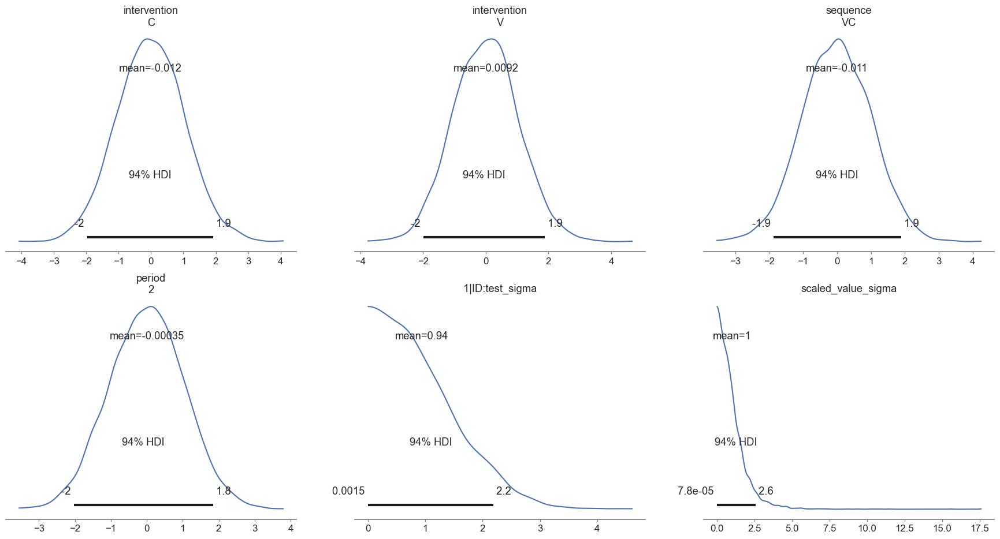

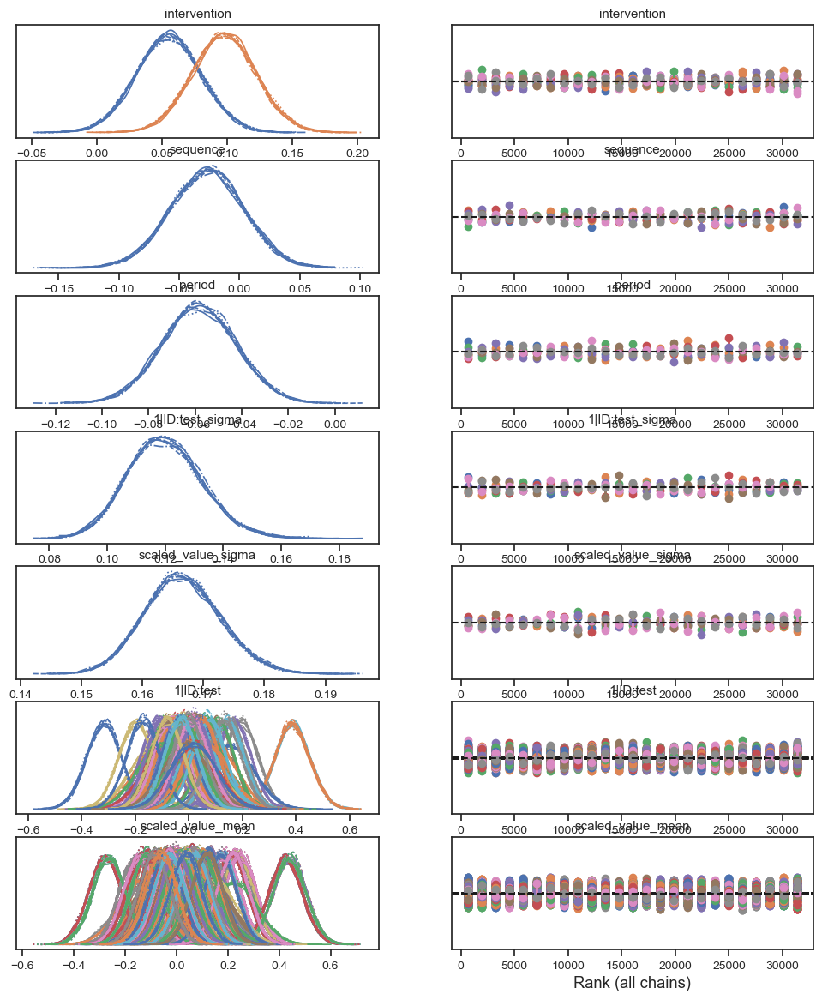

In [7]:
# intervention first model
global_model_i = bmb.Model(formula=global_formula_i,data=df, categorical=['intervention', 'sequence', 'period', 'ID'], family = 'gaussian',link="identity")
global_results_i = global_model_i.fit(tune = 2100, draws=4000, cores=8, chains=8, target_accept=.98,random_seed=random_seed)
# sequence first model
global_model_s = bmb.Model(formula=global_formula_s,data=df, categorical=['intervention', 'sequence', 'period', 'ID'], family = 'gaussian',link="identity")
global_results_s = global_model_s.fit(tune = 2100, draws=4000, cores=8, chains=8, target_accept=.98,random_seed=random_seed)
# period first model
global_model_p = bmb.Model(formula=global_formula_p,data=df, categorical=['intervention', 'sequence', 'period', 'ID'], family = 'gaussian',link="identity")
global_results_p = global_model_p.fit(tune = 2100, draws=4000, cores=8, chains=8, target_accept=.98,random_seed=random_seed)

# sample prior/posterior predictive check data
global_idata_i = bambi2idata4ppc(global_model_i,global_results_i)
global_idata_s = bambi2idata4ppc(global_model_s,global_results_s)
global_idata_p = bambi2idata4ppc(global_model_p,global_results_p)

# diagnostic plots and model
global_model_i.plot_priors();
az.plot_trace(global_idata_i, kind="rank_vlines");
global_model_i

# save data
#az.to_netcdf(global_idata_s,'global_idata_s.nc')
#az.to_netcdf(global_idata_p,'global_idata_p.nc')
#az.to_netcdf(global_idata_i,'global_idata_i.nc')

## Graph of model formulation

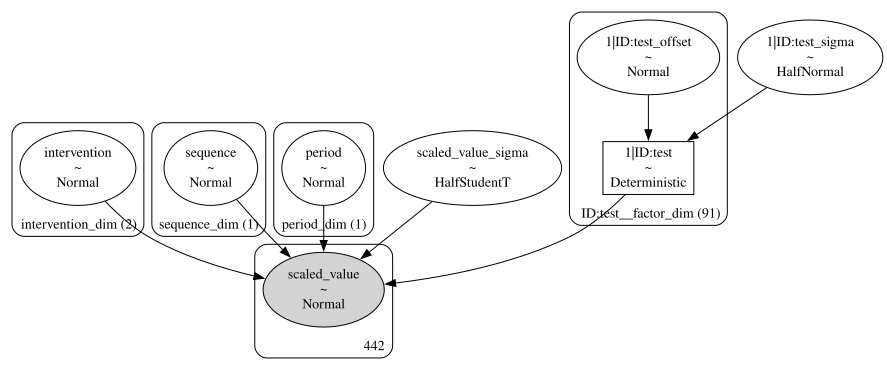

In [8]:
global_model_i.graph(formatting = 'plain') # to save PDF add: name = 'model_global', fmt = 'pdf'

## optional: load data from file

## Extract prior info

In [9]:
print({x.name:x.prior.args for x in global_model_i.terms.values()})
print(global_model_i.family.likelihood.priors)

{'intervention': {'mu': array([0., 0.]), 'sigma': array([1.03825961, 1.03825961])}, 'sequence': {'mu': array(0), 'sigma': array(1.04134508)}, 'period': {'mu': array(0), 'sigma': array(1.03825961)}, '1|ID:test': {'mu': array(0), 'sigma': HalfNormal(sigma: 1.18)}}
{'sigma': HalfStudentT(nu: 4, sigma: 0.2077)}


## Result summary

In [10]:
az.summary(global_idata_i).head(4)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
intervention[C],0.055,0.025,0.008,0.103,0.0,0.0,11415.0,17506.0,1.0
intervention[V],0.098,0.025,0.051,0.144,0.0,0.0,11476.0,17055.0,1.0
sequence[VC],-0.027,0.031,-0.085,0.030,0.0,0.0,11235.0,16378.0,1.0
period[2],-0.058,0.016,-0.088,-0.028,0.0,0.0,44402.0,23891.0,1.0


In [11]:
az.summary(global_idata_i).describe().round(3)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
count,539.000,539.000,539.000,539.000,539.0,539.000,539.000,539.000,539.0
mean,0.029,0.064,-0.091,0.149,0.0,0.000,60422.306,23608.180,1.0
std,0.108,0.010,0.110,0.109,0.0,0.000,8703.926,911.445,0.0
min,-0.318,0.006,-0.435,-0.194,0.0,0.000,11235.000,16378.000,1.0
25%,-0.032,0.060,-0.149,0.084,0.0,0.000,57899.500,23111.500,1.0
50%,0.017,0.061,-0.100,0.141,0.0,0.000,62539.000,23649.000,1.0
75%,0.076,0.061,-0.042,0.194,0.0,0.000,65579.000,24185.000,1.0
max,0.443,0.088,0.324,0.564,0.0,0.001,72862.000,25690.000,1.0


## Plot fit estimates

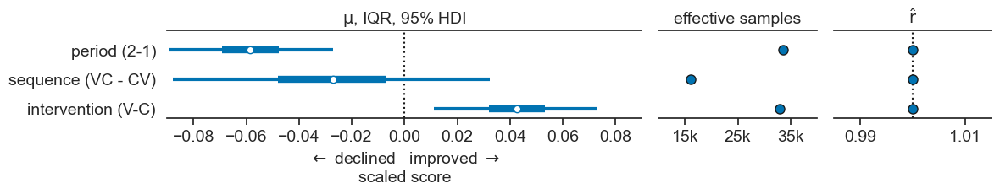

In [12]:
glob_dict = dict()
glob_dict_diff = dict()

# Get data from posterior and calculate difference
# period first model
glob_dict['period (2)'] = global_idata_p.posterior['period'].sel({'period_dim':'2'})
glob_dict['period (1)'] = global_idata_p.posterior['period'].sel({'period_dim':'1'})
glob_dict_diff['period (2-1)'] = glob_dict['period (2)']-glob_dict['period (1)']
# sequence first model
glob_dict['sequence (VC)'] = global_idata_s.posterior['sequence'].sel({'sequence_dim':'VC'})
glob_dict['sequence (CV)'] = global_idata_s.posterior['sequence'].sel({'sequence_dim':'CV'})
glob_dict_diff['sequence (VC - CV)'] = glob_dict['sequence (VC)']-glob_dict['sequence (CV)']
# intervention first model
glob_dict['intervention (V)'] = global_idata_i.posterior['intervention'].sel({'intervention_dim':'V'})
glob_dict['intervention (C)'] = global_idata_i.posterior['intervention'].sel({'intervention_dim':'C'})
glob_dict_diff['intervention (V-C)'] = glob_dict['intervention (V)']-glob_dict['intervention (C)']

# plot HDI of level difference
gaxs = az.plot_forest(sort_dict_by_mean(glob_dict_diff),hdi_prob=0.95, combined=True,r_hat=True, ess=True,
                      figsize=(12,2.5),linewidth=3,textsize=14,markersize=8,
                      colors = [ sns_to_hex(sns.color_palette("colorblind")[0]) ])

gaxs[0].set_title('$\mathrm{\mu}$, IQR, 95% HDI',size=14)
gaxs[0].axvline(x=0,color='k',ls=':',zorder=-1)
gaxs[0].set_xlim((-0.09,0.09))
#gaxs[0].set_xticks([-0.1, 0, 0.1])
gaxs[0].set_xlabel(r'$\leftarrow$ declined   improved $\rightarrow$'
                  '\n'
                  'scaled score',size=14)
gaxs[1].set_title('effective samples',size=14)
gaxs[1].set_xlim((10_000,40_000))
gaxs[1].set_xticks(     [15_000,25_000,35_000])
gaxs[1].set_xticklabels([ '15k','25k','35k'])
gaxs[2].axvline(x=1,color='k',ls=':',zorder=-1)
gaxs[2].set_xlim((0.985,1.015))
gaxs[2].set_xticks([0.99,1.01])
gaxs[2].set_title('$\mathrm{\hat{r}}$',size=14)
plt.gcf().tight_layout()
#plt.savefig('bambi_global_diff_scaled'+'.pdf')
plt.show()

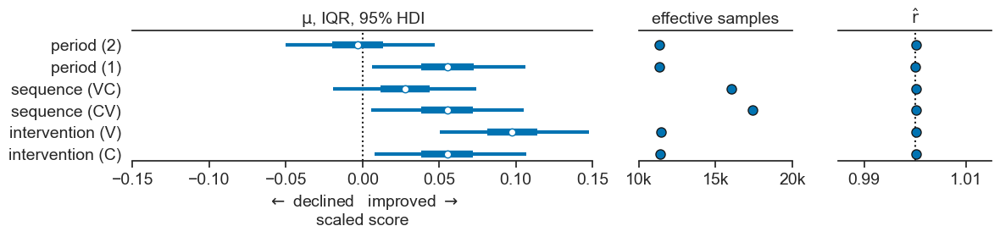

In [13]:
# plot HDI of levels
gaxs = az.plot_forest(glob_dict,hdi_prob=0.95, combined=True,r_hat=True, ess=True,figsize=(12,3),
                     linewidth=3,textsize=14,markersize=8,
                      colors = [ sns_to_hex(sns.color_palette("colorblind")[0]) ])

gaxs[0].set_title('$\mathrm{\mu}$, IQR, 95% HDI',size=14)
gaxs[0].axvline(x=0,color='k',ls=':',zorder=-1)
gaxs[0].set_xlim((-0.15,0.15))
#gaxs[0].set_xticks([-0.1, 0, 0.1])
gaxs[0].set_xlabel(r'$\leftarrow$ declined   improved $\rightarrow$'
                  '\n'
                  'scaled score',size=14)
gaxs[1].set_title('effective samples',size=14)
gaxs[1].set_xlim((10_000,20_000))
gaxs[1].set_xticks(     [10_000,15_000,20_000])
gaxs[1].set_xticklabels([ '10k','15k','20k'])
gaxs[2].axvline(x=1,color='k',ls=':',zorder=-1)
gaxs[2].set_xlim((0.985,1.015))
gaxs[2].set_xticks([0.99,1.01])
gaxs[2].set_title('$\mathrm{\hat{r}}$',size=14)
plt.gcf().tight_layout()
#plt.savefig('bambi_all_scaled_global'+'.pdf')
plt.show()

## Plot contrasts as effect size

Effect size of intervention V - C
Computing corrected Hedge's g
Effect size of period 2 - 1
Computing corrected Hedge's g
Effect size of sequence VC - CV
Computing corrected Hedge's g


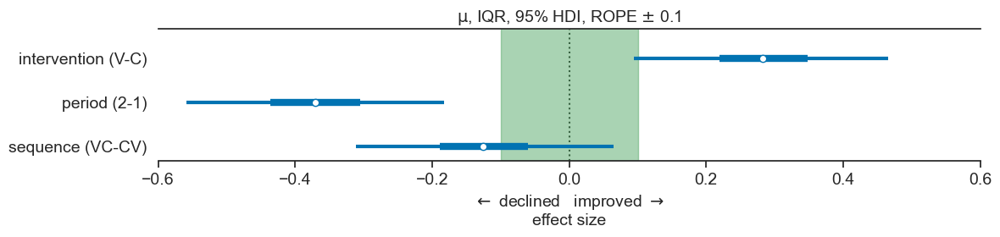

In [14]:
effs_global = dict()
effs_global['intervention (V-C)'] =  az_effect_size(global_idata_i,df,{'intervention':['C','V']})
effs_global['period (2-1)'] =        az_effect_size(global_idata_p,df,{'period':['1','2']})
effs_global['sequence (VC-CV)'] =    az_effect_size(global_idata_s,df,{'sequence':['CV','VC']})

gaxs = az.plot_forest(effs_global,hdi_prob=0.95,combined=True,r_hat=False, ess=False,figsize=(12,3),
                     linewidth=3,textsize=14,markersize=8,rope=(-0.1,0.1),
                     colors = [sns_to_hex(sns.color_palette("colorblind")[0])])
gaxs[0].set_title('$\mathrm{\mu}$, IQR, 95% HDI, ROPE $\pm$ 0.1',size=14)
gaxs[0].axvline(x=0,color='k',ls=':',zorder=-1)
gaxs[0].set_xlim((-0.6,0.6))
gaxs[0].set_xlabel(r'$\leftarrow$ declined   improved $\rightarrow$'
                  '\n'
                  "effect size",size=14)
plt.gcf().tight_layout()
#plt.savefig('bambi_global'+'.pdf')
plt.show()

## Bayes factor, prior probabilities, and single level contrast plots
### Sequence

Effect size of sequence VC - CV
Computing corrected Hedge's g


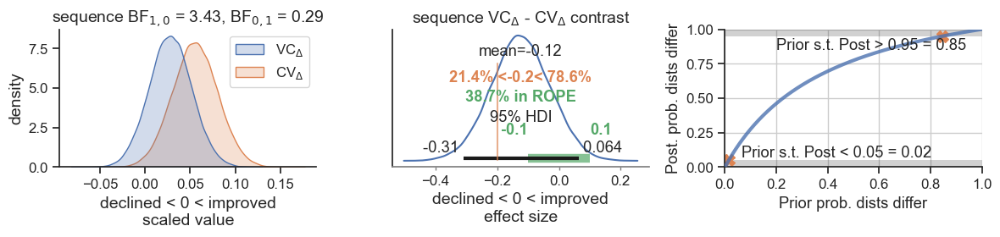

,sequence VC-CV
bf01,0.29
pc_EQ,22.60
neg_pc_large,0.00
neg_pc_medium,0.00
neg_pc_small,21.44
neg_pc_below_small,21.45
pc_in_rope,38.66
hdi95_lower,-0.31
mean,-0.12
hdi95_higher,0.06


In [15]:
dim = 'sequence'
lvl_h0 = 'CV'
lvl_h1 = 'VC'
dat = global_idata_s
lvl_h0_dat = (dat.posterior.stack(draws=("chain", "draw"))[dim]).sel({dim+'_dim':lvl_h0})
lvl_h1_dat = (dat.posterior.stack(draws=("chain", "draw"))[dim]).sel({dim+'_dim':lvl_h1})

bf_df, effs,bf_pri_prob = az_plot_contrast(idat=dat,df=df,dim=dim,t2=dim,lvl_h0=lvl_h0,lvl_h0_dat=lvl_h0_dat,lvl_h1=lvl_h1,lvl_h1_dat=lvl_h1_dat,ref_val=-0.2,mode='global',sav_plot_q=False)

summary = summary_stats(bf_df,effs,bf_pri_prob,dim+' '+lvl_h1+'-'+lvl_h0)
summary

### Period

Effect size of period 2 - 1
Computing corrected Hedge's g


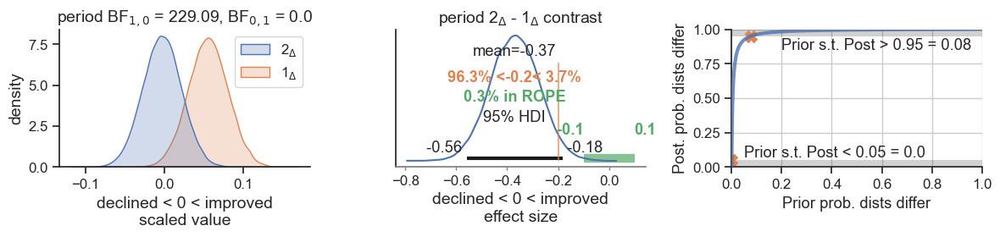

,sequence VC-CV,period 2-1
bf01,0.29,0.00
pc_EQ,22.60,0.40
neg_pc_large,0.00,0.00
neg_pc_medium,0.00,8.91
neg_pc_small,21.44,87.39
neg_pc_below_small,21.45,96.30
pc_in_rope,38.66,0.28
hdi95_lower,-0.31,-0.56
mean,-0.12,-0.37
hdi95_higher,0.06,-0.18


In [16]:
# Settings
dim = 'period'
lvl_h0 = '1'
lvl_h1 = '2'
dat = global_idata_p
lvl_h0_dat = (dat.posterior.stack(draws=("chain", "draw"))[dim]).sel({dim+'_dim':lvl_h0})
lvl_h1_dat = (dat.posterior.stack(draws=("chain", "draw"))[dim]).sel({dim+'_dim':lvl_h1})

bf_df, effs,bf_pri_prob = az_plot_contrast(idat=dat,df=df,dim=dim,t2=dim,lvl_h0=lvl_h0,lvl_h0_dat=lvl_h0_dat,lvl_h1=lvl_h1,lvl_h1_dat=lvl_h1_dat,ref_val=-0.2,mode='global',sav_plot_q=False)

summary=summary.join(summary_stats(bf_df,effs,bf_pri_prob,dim+' '+lvl_h1+'-'+lvl_h0))
summary

### Intervention

Effect size of intervention V - C
Computing corrected Hedge's g


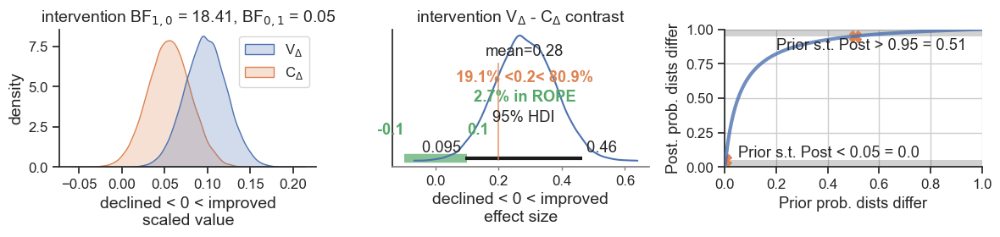

,sequence VC-CV,period 2-1,intervention V-C
bf01,0.29,0.00,0.05
pc_EQ,22.60,0.40,5.20
neg_pc_large,0.00,0.00,0.00
neg_pc_medium,0.00,8.91,0.00
neg_pc_small,21.44,87.39,0.00
neg_pc_below_small,21.45,96.30,0.00
pc_in_rope,38.66,0.28,2.69
hdi95_lower,-0.31,-0.56,0.09
mean,-0.12,-0.37,0.28
hdi95_higher,0.06,-0.18,0.46


In [17]:
dim = 'intervention'
lvl_h0 = 'C'
lvl_h1 = 'V'

# Data
dat = global_idata_i
lvl_h0_dat = (dat.posterior.stack(draws=("chain", "draw"))[dim]).sel({dim+'_dim':lvl_h0})
lvl_h1_dat = (dat.posterior.stack(draws=("chain", "draw"))[dim]).sel({dim+'_dim':lvl_h1})

bf_df, effs,bf_pri_prob = az_plot_contrast(idat=dat,df=df,dim=dim,t2=dim,lvl_h0=lvl_h0,lvl_h0_dat=lvl_h0_dat,lvl_h1=lvl_h1,lvl_h1_dat=lvl_h1_dat,ref_val=0.2,mode='global',sav_plot_q=False)

summary=summary.join(summary_stats(bf_df,effs,bf_pri_prob,dim+' '+lvl_h1+'-'+lvl_h0))
summary

## Prior and Posterior Predictive check

plotting ... ax 0,0 - intervention V - prior
plotting ... ax 0,1 - intervention V - posterior
plotting ... ax 1,0 - intervention C - prior
plotting ... ax 1,1 - intervention C - posterior
plotting ... ax 2,0 - period 1 - prior
plotting ... ax 2,1 - period 1 - posterior
plotting ... ax 3,0 - period 2 - prior
plotting ... ax 3,1 - period 2 - posterior
plotting ... ax 4,0 - sequence VC - prior
plotting ... ax 4,1 - sequence VC - posterior
plotting ... ax 5,0 - sequence CV - prior
plotting ... ax 5,1 - sequence CV - posterior


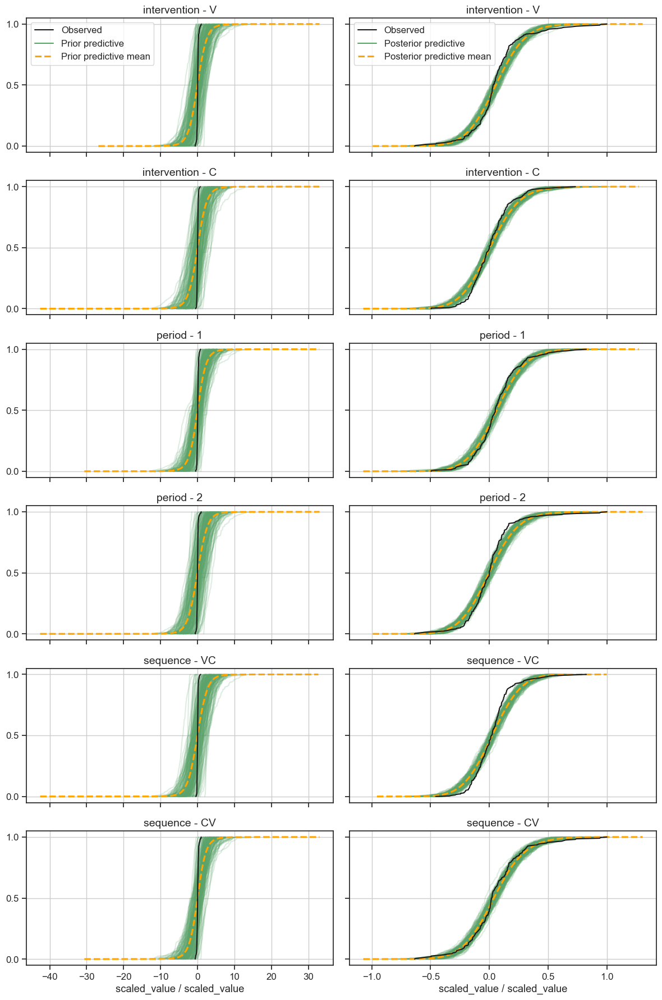

In [18]:
fig,axs = ppc_bambi(global_idata_i,
                    df = df,
                    var_names=['intervention','period','sequence'],
                    n_pp_samp=200)
#plt.savefig('bambi_global_ppc'+'.png')
plt.show()

# Fit tests-level model

In [19]:
tests_formula = "scaled_value ~ 0 + test:intervention + (period+sequence|ID:test)"

### Custom Priors

#### Normal mu = 0, sigma = 1

#### StudenT mu = 0, nu = 10

#### Cauchy alpha = 0, beta = 2

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [test:intervention, 1|ID:test_sigma, 1|ID:test_offset, period|ID:test_sigma, period|ID:test_offset, sequence|ID:test_sigma, sequence|ID:test_offset, scaled_value_sigma]


Sampling 8 chains for 11_850 tune and 20_000 draw iterations (94_800 + 160_000 draws total) took 357 seconds.
Sampling: [1|ID:test_offset, 1|ID:test_sigma, period|ID:test_offset, period|ID:test_sigma, scaled_value, scaled_value_sigma, sequence|ID:test_offset, sequence|ID:test_sigma, test:intervention]
Sampling: [1|ID:test_sigma, period|ID:test_sigma, scaled_value_sigma, sequence|ID:test_sigma, test:intervention]


Formula: scaled_value ~ 0 + test:intervention + (period+sequence|ID:test)
Family name: Gaussian
Link: identity
Observations: 442
Priors:
  Common-level effects
    test:intervention ~ Normal(mu: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.], sigma: [1.8303 1.8303 3.0725 3.0725 1.8303 1.8303 1.8303 1.8303 1.8303 1.8303
 1.8303 1.8303 3.0725 3.0725])

  Group-level effects
    1|ID:test ~ Normal(mu: 0, sigma: HalfNormal(sigma: 0.7503))
    period|ID:test ~ Normal(mu: 0, sigma: HalfNormal(sigma: 1.0383))
    sequence|ID:test ~ Normal(mu: 0, sigma: HalfNormal(sigma: 1.0413))

  Auxiliary parameters
    sigma ~ HalfStudentT(nu: 4, sigma: 0.2077)
------
* To see a plot of the priors call the .plot_priors() method.
* To see a summary or plot of the posterior pass the object returned by .fit() to az.summary() or az.plot_trace()

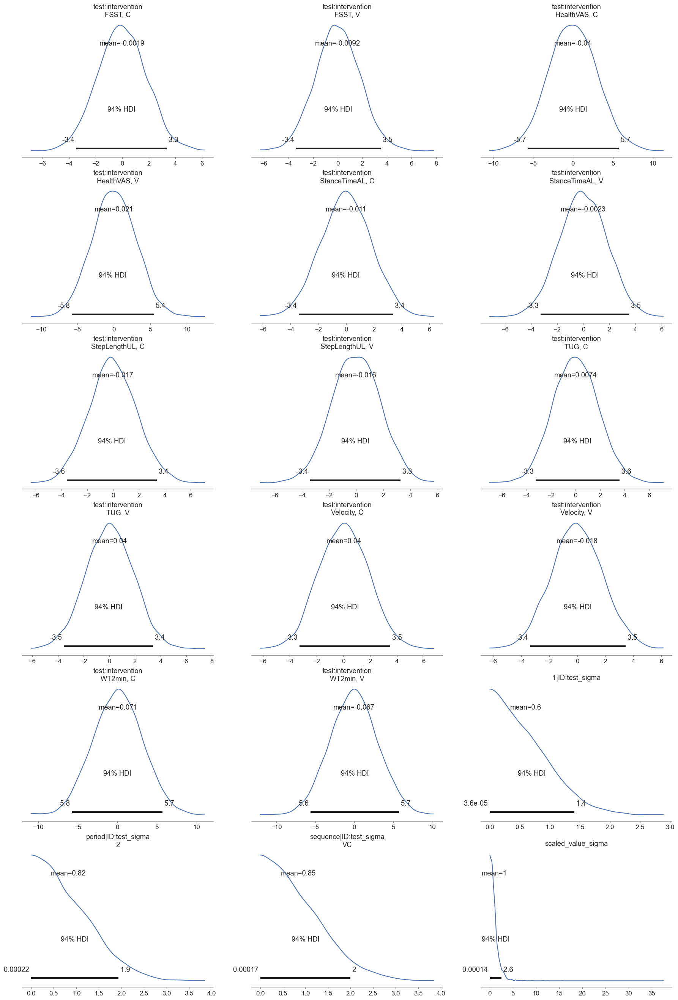

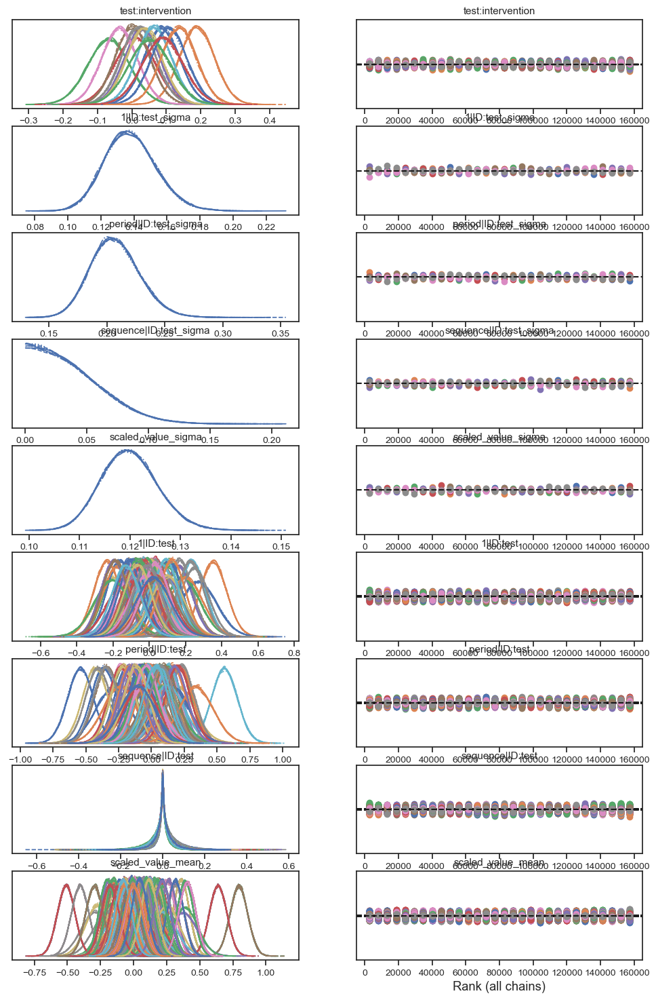

In [20]:
# tests-level model
tests_model = bmb.Model(tests_formula, df, categorical=['intervention', 'sequence', 'period', 'ID'], family = 'gaussian',link="identity")
tests_results = tests_model.fit(tune = 11850, draws=20_000, cores=8, chains=8, target_accept=.98,random_seed=random_seed)

# sample prior/posterior predictive check data
tests_idata = bambi2idata4ppc(tests_model,tests_results)

# diagnostic plots and model
tests_model.plot_priors();
az.plot_trace(tests_idata, kind="rank_vlines");
tests_model

# save data
#az.to_netcdf(tests_idata,'tests_idata.nc')

## Graph of model formulation

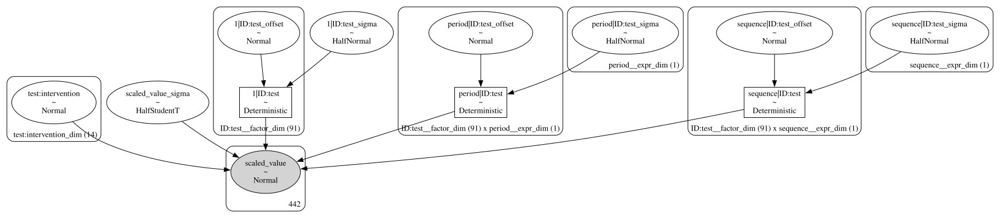

In [21]:
tests_model.graph(formatting = 'plain') # to save PDF add: name = 'model_tests', fmt = 'pdf'

## optional: load data from file

## Extract prior info

In [22]:
print({x.name:x.prior.args for x in tests_model.terms.values()})
print(tests_model.family.likelihood.priors)

{'test:intervention': {'mu': array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]), 'sigma': array([1.83026261, 1.83026261, 3.07254259, 3.07254259, 1.83026261,
       1.83026261, 1.83026261, 1.83026261, 1.83026261, 1.83026261,
       1.83026261, 1.83026261, 3.07254259, 3.07254259])}, '1|ID:test': {'mu': array(0), 'sigma': HalfNormal(sigma: 0.7503)}, 'period|ID:test': {'mu': array(0), 'sigma': HalfNormal(sigma: 1.0383)}, 'sequence|ID:test': {'mu': array(0), 'sigma': HalfNormal(sigma: 1.0413)}}
{'sigma': HalfStudentT(nu: 4, sigma: 0.2077)}


## Result summary

In [23]:
az.summary(tests_idata).head(14)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"test:intervention[FSST, C]",0.087,0.052,-0.011,0.184,0.0,0.0,45193.0,77855.0,1.0
"test:intervention[FSST, V]",0.189,0.051,0.094,0.285,0.0,0.0,51054.0,84812.0,1.0
"test:intervention[HealthVAS, C]",-0.067,0.061,-0.180,0.048,0.0,0.0,77070.0,108924.0,1.0
"test:intervention[HealthVAS, V]",0.010,0.060,-0.101,0.124,0.0,0.0,81400.0,109125.0,1.0
"test:intervention[StanceTimeAL, C]",0.029,0.052,-0.068,0.127,0.0,0.0,45079.0,76943.0,1.0
"test:intervention[StanceTimeAL, V]",0.002,0.051,-0.096,0.097,0.0,0.0,51097.0,82935.0,1.0
"test:intervention[StepLengthUL, C]",-0.036,0.052,-0.134,0.062,0.0,0.0,46127.0,76659.0,1.0
"test:intervention[StepLengthUL, V]",0.019,0.051,-0.080,0.114,0.0,0.0,46575.0,75734.0,1.0
"test:intervention[TUG, C]",0.035,0.052,-0.063,0.132,0.0,0.0,48691.0,80226.0,1.0
"test:intervention[TUG, V]",0.065,0.051,-0.030,0.162,0.0,0.0,51704.0,82536.0,1.0


In [24]:
az.summary(tests_idata).describe().round(3)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
count,733.000,733.000,733.000,733.000,733.0,733.0,733.000,733.000,733.0
mean,0.018,0.070,-0.116,0.151,0.0,0.0,178907.265,124737.651,1.0
std,0.146,0.020,0.154,0.146,0.0,0.0,53618.777,19069.529,0.0
min,-0.540,0.006,-0.725,-0.383,0.0,0.0,23074.000,41168.000,1.0
25%,-0.049,0.061,-0.191,0.078,0.0,0.0,144759.000,117428.000,1.0
50%,0.002,0.066,-0.107,0.133,0.0,0.0,197126.000,131524.000,1.0
75%,0.082,0.078,-0.058,0.214,0.0,0.0,212015.000,138470.000,1.0
max,0.795,0.133,0.669,0.922,0.0,0.0,307813.000,146407.000,1.0


## Plot fit estimates

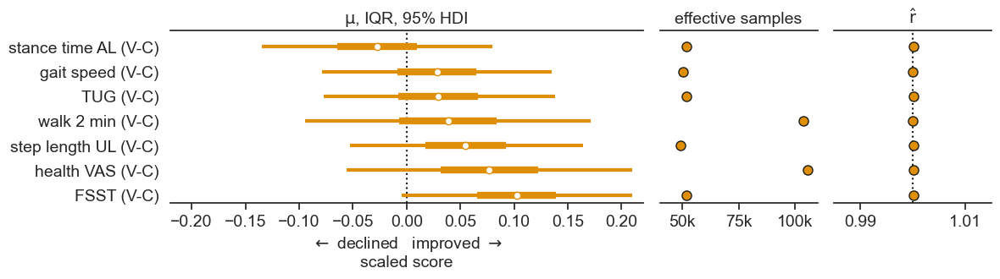

In [25]:
tests = ['StanceTimeAL','Velocity','TUG','WT2min','StepLengthUL','HealthVAS','FSST'] # ordered by mean score
tests_dict_diff = dict()
tests_dict = dict()
# get data from posterior and calculate difference
for t in tests:
    _,unit,t2 = scaleback(t,df)
    tests_dict[t2+" (V)"] = tests_idata.posterior['test:intervention'].sel({'test:intervention_dim':t+', V'})
    tests_dict[t2+" (C)"] = tests_idata.posterior['test:intervention'].sel({'test:intervention_dim':t+', C'})
    tests_dict_diff[t2+ ' (V-C)']= tests_dict[t2+" (V)"]-tests_dict[t2+" (C)"]

# plot HDI of level difference
axs = az.plot_forest(sort_dict_by_mean(tests_dict_diff),hdi_prob=0.95,combined=True,r_hat=True, ess=True,
                     figsize=(12,3.5), linewidth=3,textsize=14,
                     colors = [sns_to_hex(sns.color_palette("colorblind")[1])],markersize=8)
axs[0].set_title('$\mathrm{\mu}$, IQR, 95% HDI',size=14)
axs[0].axvline(x=0,color='k',ls=':',zorder=-1)
axs[0].set_xlim((-0.22,0.22))
axs[0].set_xlabel(r'$\leftarrow$ declined   improved $\rightarrow$'
                  '\n'
                  'scaled score',size=14)
axs[1].set_title('effective samples',size=14)
axs[1].set_xlim((40_000,110_000))
axs[1].set_xticks([50_000,75_000,100_000])
axs[1].set_xticklabels(['50k','75k','100k'])
axs[2].axvline(x=1,color='k',ls=':',zorder=-1)
axs[2].set_xlim((0.985,1.015))
axs[2].set_xticks([0.99,1.01])
axs[2].set_title('$\mathrm{\hat{r}}$',size=14)
plt.gcf().tight_layout()
#plt.savefig('bambi_tests_diff_scaled'+'.pdf')
plt.show()

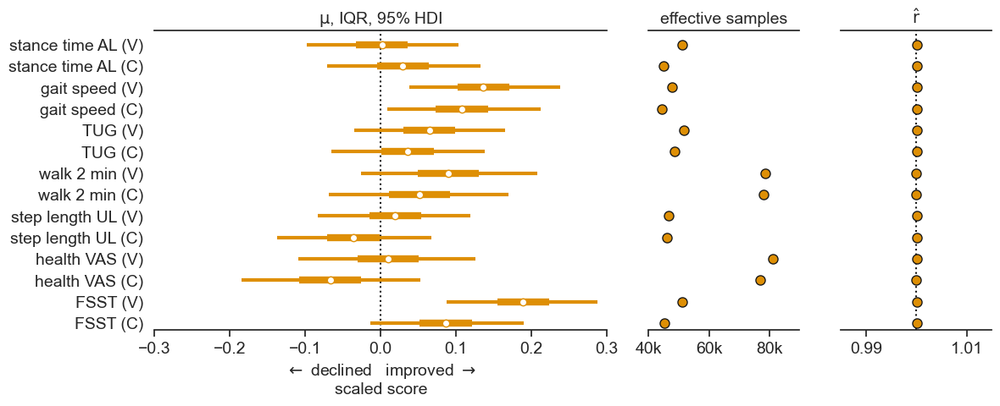

In [26]:
# plot HDI of levels
gaxs = az.plot_forest(tests_dict,hdi_prob=0.95, combined=True,r_hat=True, ess=True,figsize=(12,5),
                     linewidth=3,textsize=14,markersize=8,
                      colors = [ sns_to_hex(sns.color_palette("colorblind")[1]) ])

gaxs[0].set_title('$\mathrm{\mu}$, IQR, 95% HDI',size=14)
gaxs[0].axvline(x=0,color='k',ls=':',zorder=-1)
gaxs[0].set_xlim((-0.3,0.3))
gaxs[0].set_xlabel(r'$\leftarrow$ declined   improved $\rightarrow$'
                  '\n'
                  'scaled score',size=14)
gaxs[1].set_title('effective samples',size=14)
gaxs[1].set_xlim((40_000,90_000))
gaxs[1].set_xticks(     [40_000,60_000,80_000])
gaxs[1].set_xticklabels([ '40k','60k','80k'])
gaxs[2].axvline(x=1,color='k',ls=':',zorder=-1)
gaxs[2].set_xlim((0.985,1.015))
gaxs[2].set_xticks([0.99,1.01])
gaxs[2].set_title('$\mathrm{\hat{r}}$',size=14)
plt.gcf().tight_layout()
#plt.savefig('bambi_all_scaled_tests'+'.pdf')
plt.show()

## Plot contrasts as effect size

Effect size of test StanceTimeAL contrasting intervention V - C
Computing corrected Hedge's g
Effect size of test Velocity contrasting intervention V - C
Computing corrected Hedge's g
Effect size of test TUG contrasting intervention V - C
Computing corrected Hedge's g
Effect size of test WT2min contrasting intervention V - C
Computing corrected Hedge's g
Effect size of test StepLengthUL contrasting intervention V - C
Computing corrected Hedge's g
Effect size of test HealthVAS contrasting intervention V - C
Computing corrected Hedge's g
Effect size of test FSST contrasting intervention V - C
Computing corrected Hedge's g


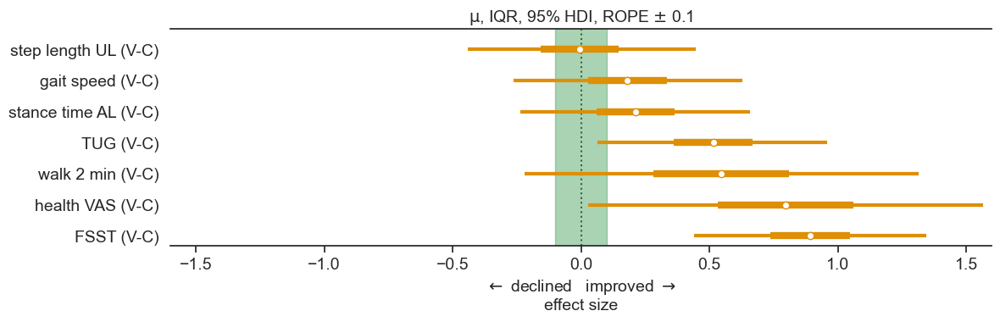

In [27]:
tests = ['StanceTimeAL','Velocity','TUG','WT2min','StepLengthUL','HealthVAS','FSST'] # ordered by mean score
effs_tests = dict()
for t in tests:
    _,unit,t2 = scaleback(t,df)
    effs_tests[t2+ ' (V-C)']= az_effect_size(tests_idata,df,{'test':t},{'intervention':['C','V']})    
    
axs = az.plot_forest(sort_dict_by_mean(effs_tests),
                     hdi_prob=0.95,combined=True,r_hat=False, ess=False,figsize=(12,4),
                     linewidth=3,textsize=14,markersize=8,rope=(-0.1,0.1),
                     colors = [sns_to_hex(sns.color_palette("colorblind")[1])] )
axs[0].set_title('$\mathrm{\mu}$, IQR, 95% HDI, ROPE $\pm$ 0.1',size=14)
axs[0].axvline(x=0,color='k',ls=':',zorder=-1)
axs[0].set_xlim((-1.6,1.6))
axs[0].set_xlabel(r'$\leftarrow$ declined   improved $\rightarrow$'
                  '\n'
                  "effect size",size=14)
plt.gcf().tight_layout()
#plt.savefig('bambi_tests_es'+'.pdf')
plt.show()

## Bayes Factor, prior probabilities, and single level contrast plots

### TUG

Effect size of test TUG contrasting intervention V - C
Computing corrected Hedge's g


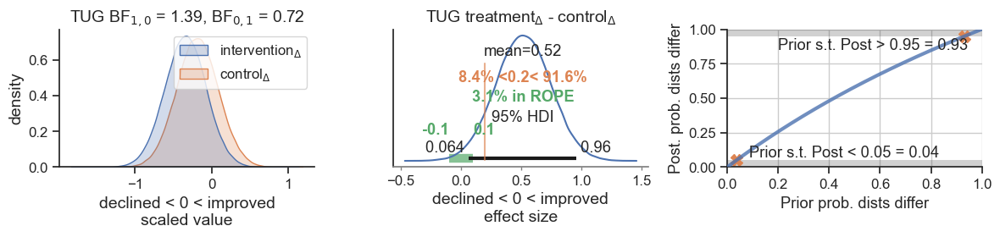

,sequence VC-CV,period 2-1,intervention V-C,TUG V-C
bf01,0.29,0.00,0.05,0.72
pc_EQ,22.60,0.40,5.20,41.90
neg_pc_large,0.00,0.00,0.00,0.00
neg_pc_medium,0.00,8.91,0.00,0.00
neg_pc_small,21.44,87.39,0.00,0.09
neg_pc_below_small,21.45,96.30,0.00,0.09
pc_in_rope,38.66,0.28,2.69,3.13
hdi95_lower,-0.31,-0.56,0.09,0.06
mean,-0.12,-0.37,0.28,0.52
hdi95_higher,0.06,-0.18,0.46,0.96


In [28]:
dim = 'TUG'
# Data
s,unit,t2 = scaleback(dim,df)
vib = (tests_idata.posterior.stack(draws=("chain", "draw"))['test:intervention']).sel({'test:intervention_dim':dim+', V'})*s
con = (tests_idata.posterior.stack(draws=("chain", "draw"))['test:intervention']).sel({'test:intervention_dim':dim+', C'})*s

bf_df, effs,bf_pri_prob = az_plot_contrast(idat=tests_idata,df=df,t2=t2,dim=dim,lvl_h0=dim+', C',lvl_h0_dat=con,lvl_h1=dim+', V',lvl_h1_dat=vib,ref_val=0.2,mode='tests',sav_plot_q=False)

summary=summary.join(summary_stats(bf_df,effs,bf_pri_prob,t2+' '+lvl_h1+'-'+lvl_h0))
summary

### Walk 2 min

Effect size of test WT2min contrasting intervention V - C
Computing corrected Hedge's g


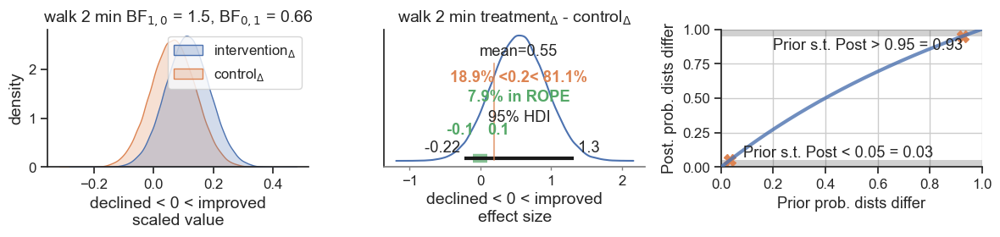

,sequence VC-CV,period 2-1,intervention V-C,TUG V-C,walk 2 min V-C
bf01,0.29,0.00,0.05,0.72,0.66
pc_EQ,22.60,0.40,5.20,41.90,39.90
neg_pc_large,0.00,0.00,0.00,0.00,0.03
neg_pc_medium,0.00,8.91,0.00,0.00,0.34
neg_pc_small,21.44,87.39,0.00,0.09,2.40
neg_pc_below_small,21.45,96.30,0.00,0.09,2.77
pc_in_rope,38.66,0.28,2.69,3.13,7.88
hdi95_lower,-0.31,-0.56,0.09,0.06,-0.22
mean,-0.12,-0.37,0.28,0.52,0.55
hdi95_higher,0.06,-0.18,0.46,0.96,1.31


In [29]:
dim = 'WT2min'
# Data
s,unit,t2 = scaleback(dim,df)
vib = (tests_idata.posterior.stack(draws=("chain", "draw"))['test:intervention']).sel({'test:intervention_dim':dim+', V'})*s
con = (tests_idata.posterior.stack(draws=("chain", "draw"))['test:intervention']).sel({'test:intervention_dim':dim+', C'})*s

bf_df, effs,bf_pri_prob = az_plot_contrast(idat=tests_idata,df=df,t2=t2,dim=dim,lvl_h0=dim+', C',lvl_h0_dat=con,lvl_h1=dim+', V',lvl_h1_dat=vib,ref_val=0.2,mode='tests',sav_plot_q=False)

summary=summary.join(summary_stats(bf_df,effs,bf_pri_prob,t2+' '+lvl_h1+'-'+lvl_h0))
summary

### Health VAS

Effect size of test HealthVAS contrasting intervention V - C
Computing corrected Hedge's g


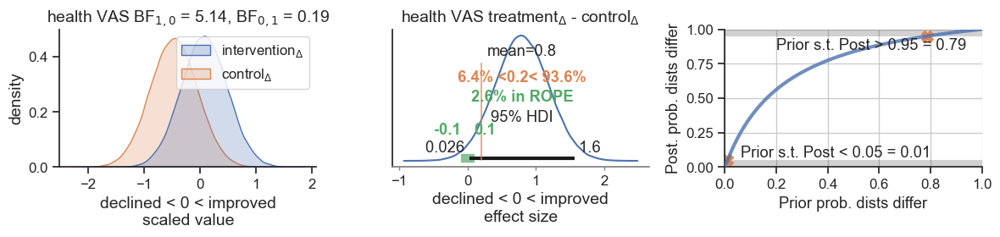

,sequence VC-CV,period 2-1,intervention V-C,TUG V-C,walk 2 min V-C,health VAS V-C
bf01,0.29,0.00,0.05,0.72,0.66,0.19
pc_EQ,22.60,0.40,5.20,41.90,39.90,16.30
neg_pc_large,0.00,0.00,0.00,0.00,0.03,0.00
neg_pc_medium,0.00,8.91,0.00,0.00,0.34,0.05
neg_pc_small,21.44,87.39,0.00,0.09,2.40,0.49
neg_pc_below_small,21.45,96.30,0.00,0.09,2.77,0.55
pc_in_rope,38.66,0.28,2.69,3.13,7.88,2.64
hdi95_lower,-0.31,-0.56,0.09,0.06,-0.22,0.03
mean,-0.12,-0.37,0.28,0.52,0.55,0.80
hdi95_higher,0.06,-0.18,0.46,0.96,1.31,1.57


In [30]:
dim = 'HealthVAS'
# Data
s,unit,t2 = scaleback(dim,df)
vib = (tests_idata.posterior.stack(draws=("chain", "draw"))['test:intervention']).sel({'test:intervention_dim':dim+', V'})*s
con = (tests_idata.posterior.stack(draws=("chain", "draw"))['test:intervention']).sel({'test:intervention_dim':dim+', C'})*s

bf_df, effs,bf_pri_prob = az_plot_contrast(idat=tests_idata,df=df,t2=t2,dim=dim,lvl_h0=dim+', C',lvl_h0_dat=con,lvl_h1=dim+', V',lvl_h1_dat=vib,ref_val=0.2,mode='tests',sav_plot_q=False)

summary=summary.join(summary_stats(bf_df,effs,bf_pri_prob,t2+' '+lvl_h1+'-'+lvl_h0))
summary

### FSST

Effect size of test FSST contrasting intervention V - C
Computing corrected Hedge's g


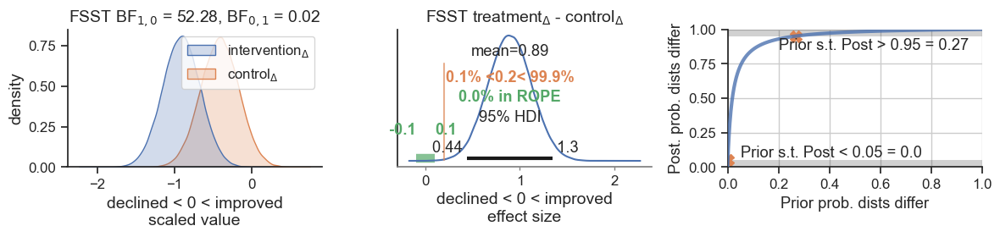

,sequence VC-CV,period 2-1,intervention V-C,TUG V-C,walk 2 min V-C,health VAS V-C,FSST V-C
bf01,0.29,0.00,0.05,0.72,0.66,0.19,0.02
pc_EQ,22.60,0.40,5.20,41.90,39.90,16.30,1.90
neg_pc_large,0.00,0.00,0.00,0.00,0.03,0.00,0.00
neg_pc_medium,0.00,8.91,0.00,0.00,0.34,0.05,0.00
neg_pc_small,21.44,87.39,0.00,0.09,2.40,0.49,0.00
neg_pc_below_small,21.45,96.30,0.00,0.09,2.77,0.55,0.00
pc_in_rope,38.66,0.28,2.69,3.13,7.88,2.64,0.03
hdi95_lower,-0.31,-0.56,0.09,0.06,-0.22,0.03,0.44
mean,-0.12,-0.37,0.28,0.52,0.55,0.80,0.89
hdi95_higher,0.06,-0.18,0.46,0.96,1.31,1.57,1.34


In [31]:
dim = 'FSST'
# Data
s,unit,t2 = scaleback(dim,df)
vib = (tests_idata.posterior.stack(draws=("chain", "draw"))['test:intervention']).sel({'test:intervention_dim':dim+', V'})*s
con = (tests_idata.posterior.stack(draws=("chain", "draw"))['test:intervention']).sel({'test:intervention_dim':dim+', C'})*s

bf_df, effs,bf_pri_prob = az_plot_contrast(idat=tests_idata,df=df,t2=t2,dim=dim,lvl_h0=dim+', C',lvl_h0_dat=con,lvl_h1=dim+', V',lvl_h1_dat=vib,ref_val=0.2,mode='tests',sav_plot_q=False)

summary=summary.join(summary_stats(bf_df,effs,bf_pri_prob,t2+' '+lvl_h1+'-'+lvl_h0))
summary

### Stance time affected leg

Effect size of test StanceTimeAL contrasting intervention V - C
Computing corrected Hedge's g


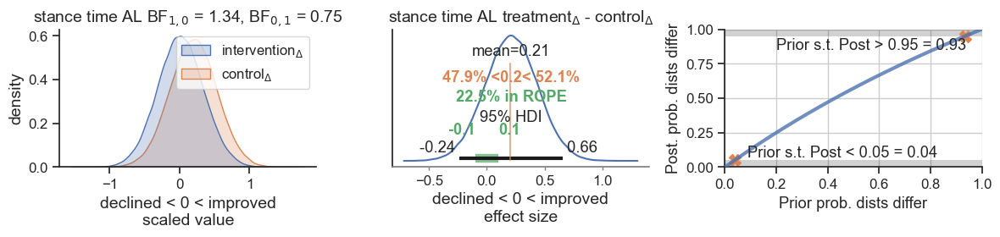

,sequence VC-CV,period 2-1,intervention V-C,TUG V-C,walk 2 min V-C,health VAS V-C,FSST V-C,stance time AL V-C
bf01,0.29,0.00,0.05,0.72,0.66,0.19,0.02,0.75
pc_EQ,22.60,0.40,5.20,41.90,39.90,16.30,1.90,42.80
neg_pc_large,0.00,0.00,0.00,0.00,0.03,0.00,0.00,0.00
neg_pc_medium,0.00,8.91,0.00,0.00,0.34,0.05,0.00,0.08
neg_pc_small,21.44,87.39,0.00,0.09,2.40,0.49,0.00,3.41
neg_pc_below_small,21.45,96.30,0.00,0.09,2.77,0.55,0.00,3.49
pc_in_rope,38.66,0.28,2.69,3.13,7.88,2.64,0.03,22.51
hdi95_lower,-0.31,-0.56,0.09,0.06,-0.22,0.03,0.44,-0.24
mean,-0.12,-0.37,0.28,0.52,0.55,0.80,0.89,0.21
hdi95_higher,0.06,-0.18,0.46,0.96,1.31,1.57,1.34,0.66


In [32]:
dim = 'StanceTimeAL'
# Data
s,unit,t2 = scaleback(dim,df)
vib = (tests_idata.posterior.stack(draws=("chain", "draw"))['test:intervention']).sel({'test:intervention_dim':dim+', V'})*s
con = (tests_idata.posterior.stack(draws=("chain", "draw"))['test:intervention']).sel({'test:intervention_dim':dim+', C'})*s

bf_df, effs,bf_pri_prob = az_plot_contrast(idat=tests_idata,df=df,t2=t2,dim=dim,lvl_h0=dim+', C',lvl_h0_dat=con,lvl_h1=dim+', V',lvl_h1_dat=vib,ref_val=0.2,mode='tests',sav_plot_q=False)

summary=summary.join(summary_stats(bf_df,effs,bf_pri_prob,t2+' '+lvl_h1+'-'+lvl_h0))
summary

### Step length unaffected leg

Effect size of test StepLengthUL contrasting intervention V - C
Computing corrected Hedge's g


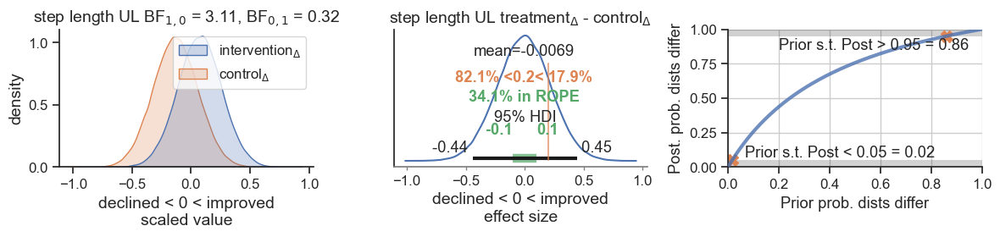

,sequence VC-CV,period 2-1,intervention V-C,TUG V-C,walk 2 min V-C,health VAS V-C,FSST V-C,stance time AL V-C,step length UL V-C
bf01,0.29,0.00,0.05,0.72,0.66,0.19,0.02,0.75,0.32
pc_EQ,22.60,0.40,5.20,41.90,39.90,16.30,1.90,42.80,24.40
neg_pc_large,0.00,0.00,0.00,0.00,0.03,0.00,0.00,0.00,0.02
neg_pc_medium,0.00,8.91,0.00,0.00,0.34,0.05,0.00,0.08,1.47
neg_pc_small,21.44,87.39,0.00,0.09,2.40,0.49,0.00,3.41,18.23
neg_pc_below_small,21.45,96.30,0.00,0.09,2.77,0.55,0.00,3.49,19.72
pc_in_rope,38.66,0.28,2.69,3.13,7.88,2.64,0.03,22.51,34.12
hdi95_lower,-0.31,-0.56,0.09,0.06,-0.22,0.03,0.44,-0.24,-0.44
mean,-0.12,-0.37,0.28,0.52,0.55,0.80,0.89,0.21,-0.01
hdi95_higher,0.06,-0.18,0.46,0.96,1.31,1.57,1.34,0.66,0.45


In [33]:
dim = 'StepLengthUL'
# Data
s,unit,t2 = scaleback(dim,df)
vib = (tests_idata.posterior.stack(draws=("chain", "draw"))['test:intervention']).sel({'test:intervention_dim':dim+', V'})*s
con = (tests_idata.posterior.stack(draws=("chain", "draw"))['test:intervention']).sel({'test:intervention_dim':dim+', C'})*s

bf_df, effs,bf_pri_prob = az_plot_contrast(idat=tests_idata,df=df,t2=t2,dim=dim,lvl_h0=dim+', C',lvl_h0_dat=con,lvl_h1=dim+', V',lvl_h1_dat=vib,ref_val=0.2,mode='tests',sav_plot_q=False)

summary=summary.join(summary_stats(bf_df,effs,bf_pri_prob,t2+' '+lvl_h1+'-'+lvl_h0))
summary

### Gait speed

Effect size of test Velocity contrasting intervention V - C
Computing corrected Hedge's g


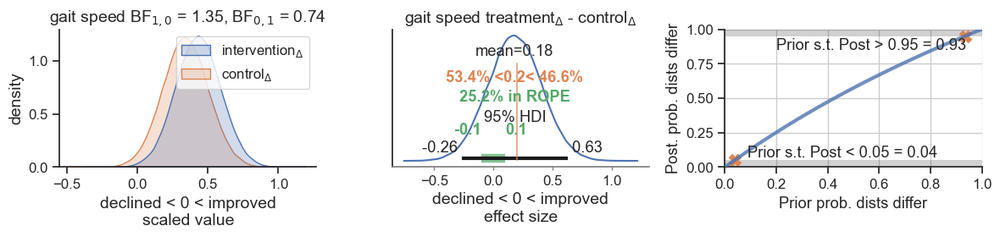

,sequence VC-CV,period 2-1,intervention V-C,TUG V-C,walk 2 min V-C,health VAS V-C,FSST V-C,stance time AL V-C,step length UL V-C,gait speed V-C
bf01,0.29,0.00,0.05,0.72,0.66,0.19,0.02,0.75,0.32,0.74
pc_EQ,22.60,0.40,5.20,41.90,39.90,16.30,1.90,42.80,24.40,42.60
neg_pc_large,0.00,0.00,0.00,0.00,0.03,0.00,0.00,0.00,0.02,0.00
neg_pc_medium,0.00,8.91,0.00,0.00,0.34,0.05,0.00,0.08,1.47,0.14
neg_pc_small,21.44,87.39,0.00,0.09,2.40,0.49,0.00,3.41,18.23,4.50
neg_pc_below_small,21.45,96.30,0.00,0.09,2.77,0.55,0.00,3.49,19.72,4.64
pc_in_rope,38.66,0.28,2.69,3.13,7.88,2.64,0.03,22.51,34.12,25.21
hdi95_lower,-0.31,-0.56,0.09,0.06,-0.22,0.03,0.44,-0.24,-0.44,-0.26
mean,-0.12,-0.37,0.28,0.52,0.55,0.80,0.89,0.21,-0.01,0.18
hdi95_higher,0.06,-0.18,0.46,0.96,1.31,1.57,1.34,0.66,0.45,0.63


In [34]:
dim = 'Velocity'
# Data
s,unit,t2 = scaleback(dim,df)
vib = (tests_idata.posterior.stack(draws=("chain", "draw"))['test:intervention']).sel({'test:intervention_dim':dim+', V'})*s
con = (tests_idata.posterior.stack(draws=("chain", "draw"))['test:intervention']).sel({'test:intervention_dim':dim+', C'})*s

bf_df, effs,bf_pri_prob = az_plot_contrast(idat=tests_idata,df=df,t2=t2,dim=dim,lvl_h0=dim+', C',lvl_h0_dat=con,lvl_h1=dim+', V',lvl_h1_dat=vib,ref_val=0.2,mode='tests',sav_plot_q=False)

summary=summary.join(summary_stats(bf_df,effs,bf_pri_prob,t2+' '+lvl_h1+'-'+lvl_h0))
summary

## Prior and Posterior Predictive check

plotting ... ax 0,0 - test FSST : intervention V - prior
plotting ... ax 0,1 - test FSST : intervention V - posterior
plotting ... ax 1,0 - test FSST : intervention C - prior
plotting ... ax 1,1 - test FSST : intervention C - posterior
plotting ... ax 2,0 - test StanceTimeAL : intervention V - prior
plotting ... ax 2,1 - test StanceTimeAL : intervention V - posterior
plotting ... ax 3,0 - test StanceTimeAL : intervention C - prior
plotting ... ax 3,1 - test StanceTimeAL : intervention C - posterior
plotting ... ax 4,0 - test TUG : intervention V - prior
plotting ... ax 4,1 - test TUG : intervention V - posterior
plotting ... ax 5,0 - test TUG : intervention C - prior
plotting ... ax 5,1 - test TUG : intervention C - posterior
plotting ... ax 6,0 - test HealthVAS : intervention V - prior
plotting ... ax 6,1 - test HealthVAS : intervention V - posterior
plotting ... ax 7,0 - test HealthVAS : intervention C - prior
plotting ... ax 7,1 - test HealthVAS : intervention C - posterior
plotting

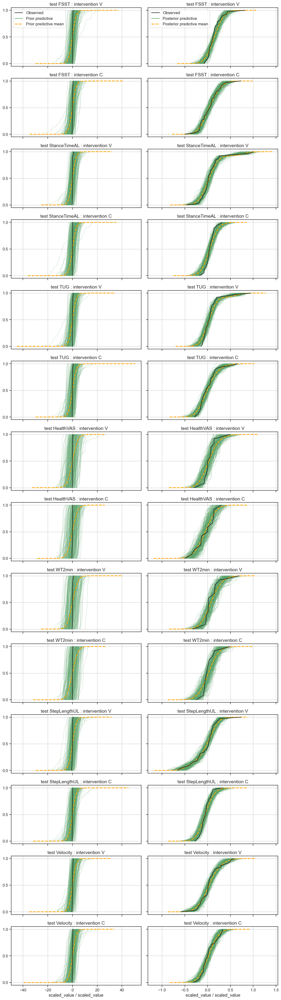

In [35]:
fig,axs = ppc_bambi(tests_idata,
                    df = df,
                    var_names=['test'],
                    subset='intervention',
                    n_pp_samp = 200
                   )
#plt.savefig('bambi_test_treat_ppc'+'.png')
plt.show()

# Plot fit results in real scale

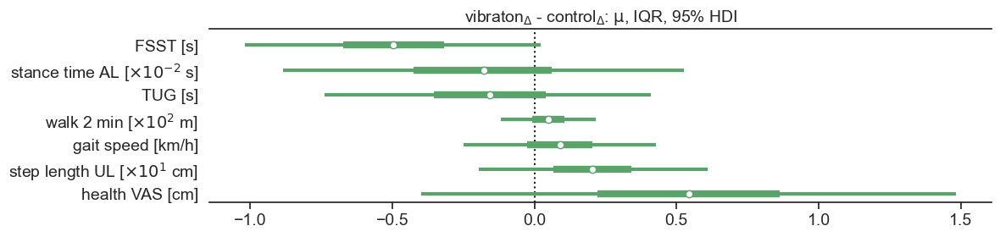

In [36]:
d = dict()
for t in tests:
    s,unit,t2 = scaleback(t,df)
    d[t2+unit]=(tests_idata.posterior['test:intervention'].sel({'test:intervention_dim':t+', V'})-
                tests_idata.posterior['test:intervention'].sel({'test:intervention_dim':t+', C'}))
    d[t2+unit]=d[t2+unit] * s
    
axs = az.plot_forest(sort_dict_by_mean(d),hdi_prob=0.95,combined=True,r_hat=False, ess=False,figsize=(12,3),
                     linewidth=3,textsize=14,colors='#5AA36A',markersize=8)
axs[0].set_title('vibraton$_\Delta$ - control$_\Delta$: $\mathrm{\mu}$, IQR, 95% HDI',size=14)
axs[0].axvline(x=0,color='k',ls=':',zorder=-1)
plt.gcf().tight_layout()
#plt.savefig('bambi_tests_real_diff'+'.pdf')
plt.show()

# Fit ID-level model

In [37]:
ID_formula = "scaled_value ~ 0 + ID:intervention + (period+sequence|ID:test)"

### Custom Priors

#### Normal mu = 0, sigma = 1

#### StudentT mu = 0, nu = 10

#### Cauchy alpha = 0, beta = 2

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [ID:intervention, 1|ID:test_sigma, 1|ID:test_offset, period|ID:test_sigma, period|ID:test_offset, sequence|ID:test_sigma, sequence|ID:test_offset, scaled_value_sigma]


Sampling 8 chains for 3_600 tune and 6_000 draw iterations (28_800 + 48_000 draws total) took 745 seconds.
Sampling: [1|ID:test_offset, 1|ID:test_sigma, ID:intervention, period|ID:test_offset, period|ID:test_sigma, scaled_value, scaled_value_sigma, sequence|ID:test_offset, sequence|ID:test_sigma]
Sampling: [1|ID:test_sigma, ID:intervention, period|ID:test_sigma, scaled_value_sigma, sequence|ID:test_sigma]


Formula: scaled_value ~ 0 + ID:intervention + (period+sequence|ID:test)
Family name: Gaussian
Link: identity
Observations: 442
Priors:
  Common-level effects
    ID:intervention ~ Normal(mu: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.], sigma: [2.6995 2.6995 2.6995 2.6995 2.6995 2.6995 2.6995 2.6995 2.6995 2.6995
 2.6995 2.6995 2.6995 2.6995 2.6995 2.6995 2.6995 2.6995 2.6995 2.6995
 2.6995 2.6995 2.6995 2.6995 2.6995 2.6995])

  Group-level effects
    1|ID:test ~ Normal(mu: 0, sigma: HalfNormal(sigma: 0.7415))
    period|ID:test ~ Normal(mu: 0, sigma: HalfNormal(sigma: 1.0383))
    sequence|ID:test ~ Normal(mu: 0, sigma: HalfNormal(sigma: 1.0413))

  Auxiliary parameters
    sigma ~ HalfStudentT(nu: 4, sigma: 0.2077)
------
* To see a plot of the priors call the .plot_priors() method.
* To see a summary or plot of the posterior pass the object returned by .fit() to az.summary() or az.plot_trace()

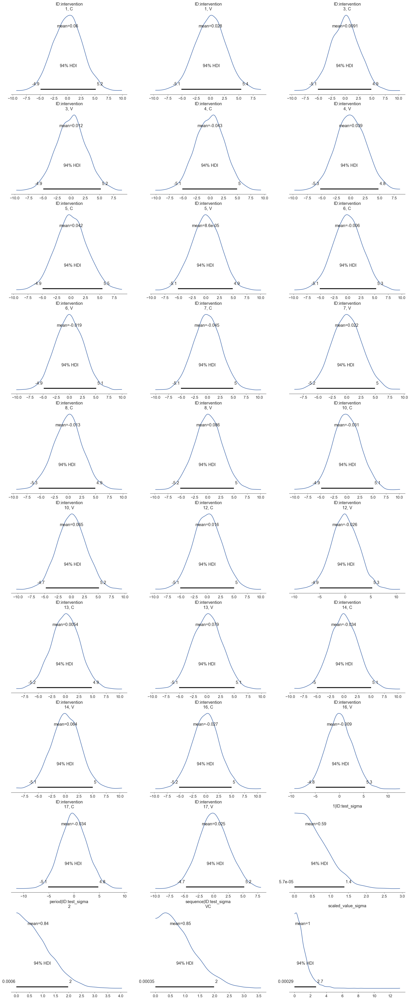

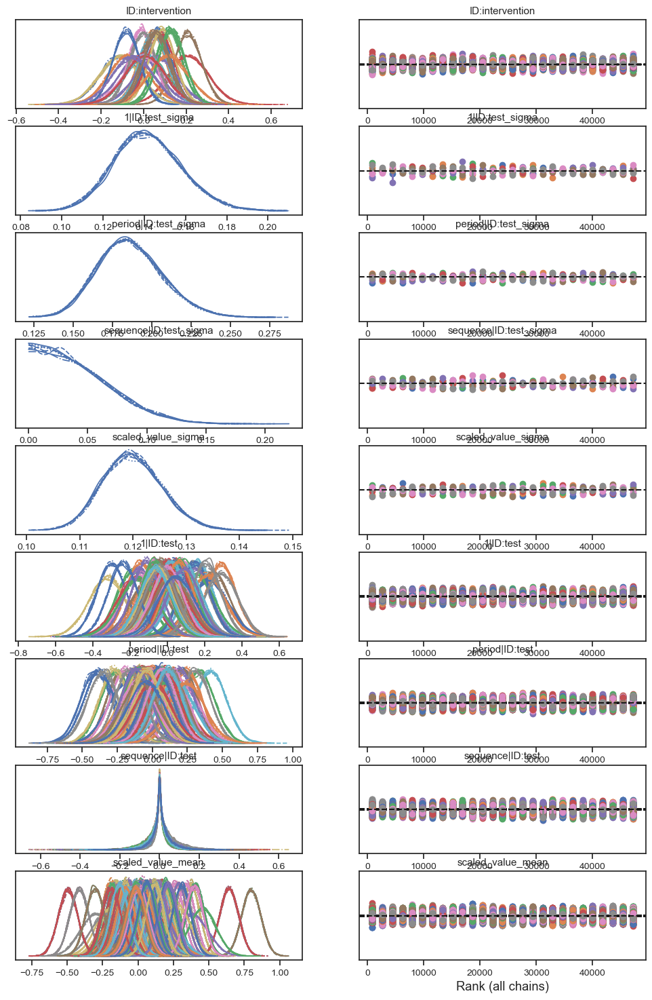

In [38]:
# tests-level model
ID_model = bmb.Model(ID_formula, df, categorical=['intervention', 'sequence', 'period', 'ID'], family = 'gaussian',link="identity")
ID_results = ID_model.fit(tune = 3600, draws=6_000, cores=8, chains=8, target_accept=.98,random_seed=random_seed)

# sample prior/posterior predictive check data
ID_idata = bambi2idata4ppc(ID_model,ID_results)

# diagnostic plots and model
ID_model.plot_priors();
az.plot_trace(ID_idata, kind="rank_vlines");
ID_model

# save
#az.to_netcdf(ID_idata,'ID_idata.nc')

## Graph of the model formulation

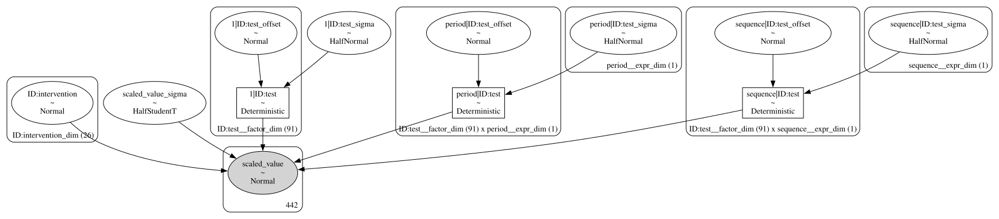

In [39]:
ID_model.graph(formatting = 'plain') # to save PDF add: name = 'model_ID', fmt = 'pdf'

## optional: load data from file

## Extraxt prior info

In [40]:
print({x.name:x.prior.args for x in ID_model.terms.values()})
print(ID_model.family.likelihood.priors)

{'ID:intervention': {'mu': array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0.]), 'sigma': array([2.69947499, 2.69947499, 2.69947499, 2.69947499, 2.69947499,
       2.69947499, 2.69947499, 2.69947499, 2.69947499, 2.69947499,
       2.69947499, 2.69947499, 2.69947499, 2.69947499, 2.69947499,
       2.69947499, 2.69947499, 2.69947499, 2.69947499, 2.69947499,
       2.69947499, 2.69947499, 2.69947499, 2.69947499, 2.69947499,
       2.69947499])}, '1|ID:test': {'mu': array(0), 'sigma': HalfNormal(sigma: 0.7415)}, 'period|ID:test': {'mu': array(0), 'sigma': HalfNormal(sigma: 1.0383)}, 'sequence|ID:test': {'mu': array(0), 'sigma': HalfNormal(sigma: 1.0413)}}
{'sigma': HalfStudentT(nu: 4, sigma: 0.2077)}


## Result summary

In [41]:
az.summary(ID_idata).head(14)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"ID:intervention[1, C]",-0.110,0.096,-0.289,0.074,0.000,0.0,38391.0,33730.0,1.0
"ID:intervention[1, V]",0.040,0.065,-0.083,0.164,0.000,0.0,39576.0,35370.0,1.0
"ID:intervention[3, C]",0.117,0.063,-0.001,0.235,0.000,0.0,38043.0,35579.0,1.0
"ID:intervention[3, V]",0.211,0.096,0.029,0.390,0.000,0.0,38578.0,31693.0,1.0
"ID:intervention[4, C]",-0.018,0.096,-0.206,0.156,0.000,0.0,38519.0,35063.0,1.0
"ID:intervention[4, V]",0.208,0.065,0.084,0.329,0.000,0.0,41585.0,35545.0,1.0
"ID:intervention[5, C]",-0.010,0.062,-0.129,0.105,0.000,0.0,36791.0,34562.0,1.0
"ID:intervention[5, V]",0.006,0.094,-0.170,0.184,0.001,0.0,35322.0,33902.0,1.0
"ID:intervention[6, C]",-0.112,0.097,-0.291,0.073,0.000,0.0,39559.0,34689.0,1.0
"ID:intervention[6, V]",0.044,0.066,-0.082,0.165,0.000,0.0,43253.0,35822.0,1.0


In [42]:
az.summary(ID_idata).describe().round(3)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
count,745.000,745.000,745.000,745.000,745.000,745.000,745.000,745.000,745.0
mean,0.022,0.074,-0.117,0.162,0.000,0.000,56917.714,38902.328,1.0
std,0.142,0.020,0.150,0.144,0.000,0.000,9092.719,3689.886,0.0
min,-0.493,0.006,-0.619,-0.366,0.000,0.000,10365.000,18101.000,1.0
25%,-0.051,0.061,-0.199,0.093,0.000,0.000,52773.000,38234.000,1.0
50%,0.006,0.066,-0.110,0.143,0.000,0.000,55027.000,40163.000,1.0
75%,0.079,0.087,-0.062,0.231,0.000,0.000,62667.000,41296.000,1.0
max,0.799,0.130,0.673,0.925,0.001,0.001,81240.000,43945.000,1.0


## Plot fit estimates

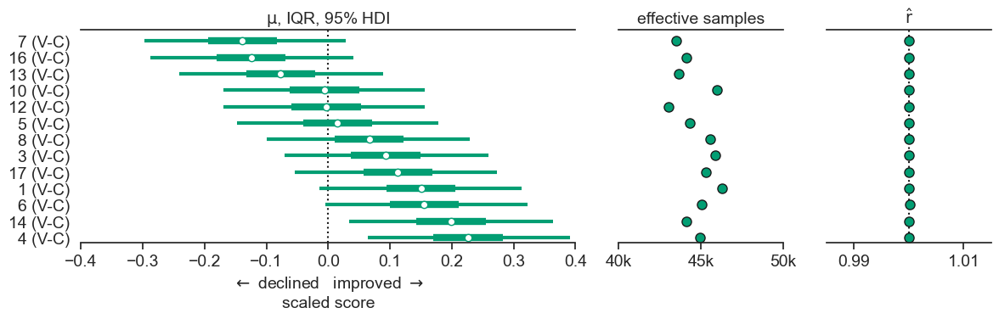

In [63]:
IDs = ['7','16','13','10','12','5','3','8','17','1','6','14','4'] # ordered by mean effect
id_dict = dict()
id_dict_diff = dict()

# get data from posterior and calculate difference
for i in IDs:
    id_dict[i+" (V)"] = ID_idata.posterior['ID:intervention'].sel({'ID:intervention_dim':i+', V'})
    id_dict[i+" (C)"] = ID_idata.posterior['ID:intervention'].sel({'ID:intervention_dim':i+', C'})
    id_dict_diff[i+ ' (V-C)']= id_dict[i+" (V)"]-id_dict[i+" (C)"]

# plot HDI of level difference
axs = az.plot_forest(sort_dict_by_mean(id_dict_diff),hdi_prob=0.95,combined=True,r_hat=True, ess=True,figsize=(12,4),
                     linewidth=3,textsize=14,
                     colors = [sns_to_hex(sns.color_palette("colorblind")[2])],markersize=8)
axs[0].set_title('$\mathrm{\mu}$, IQR, 95% HDI',size=14)
axs[0].axvline(x=0,color='k',ls=':',zorder=-1)
axs[0].set_xlim((-0.4,0.4))
axs[0].set_xlabel(r'$\leftarrow$ declined   improved $\rightarrow$'
                  '\n'
                  'scaled score',size=14)
axs[1].set_title('effective samples',size=14)
axs[1].set_xlim((40_000,50_000))
axs[1].set_xticks([40_000,45_000,50_000])
axs[1].set_xticklabels(['40k','45k','50k'])
axs[2].axvline(x=1,color='k',ls=':',zorder=-1)
axs[2].set_xlim((0.985,1.015))
axs[2].set_xticks([0.99,1.01])
axs[2].set_title('$\mathrm{\hat{r}}$',size=14)
plt.gcf().tight_layout()
#plt.savefig('bambi_IDs_diff_scaled'+'.pdf')
plt.show()

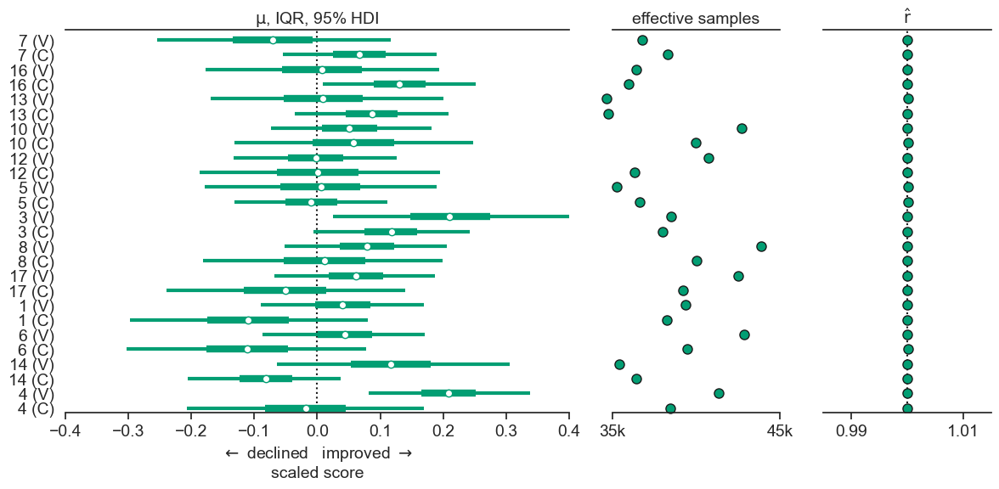

In [58]:
# plot HDI of levels
gaxs = az.plot_forest(id_dict,hdi_prob=0.95, combined=True,r_hat=True, ess=True,figsize=(12,6),
                     linewidth=3,textsize=14,markersize=8,
                      colors = [ sns_to_hex(sns.color_palette("colorblind")[2]) ])

gaxs[0].set_title('$\mathrm{\mu}$, IQR, 95% HDI',size=14)
gaxs[0].axvline(x=0,color='k',ls=':',zorder=-1)
gaxs[0].set_xlim((-0.4,0.4))
gaxs[0].set_xlabel(r'$\leftarrow$ declined   improved $\rightarrow$'
                  '\n'
                  'scaled score',size=14)
gaxs[1].set_title('effective samples',size=14)
gaxs[1].set_xlim((35_000,45_000))
gaxs[1].set_xticks(     [35_000,45_000])
gaxs[1].set_xticklabels(['35k','45k'])
gaxs[2].axvline(x=1,color='k',ls=':',zorder=-1)
gaxs[2].set_xlim((0.985,1.015))
gaxs[2].set_xticks([0.99,1.01])
gaxs[2].set_title('$\mathrm{\hat{r}}$',size=14)
plt.gcf().tight_layout()
#plt.savefig('bambi_all_scaled_IDs'+'.pdf')
plt.show()

## Plot ontrasts as effect size

Effect size of ID 7 contrasting intervention V - C
Computing corrected Hedge's g
Effect size of ID 16 contrasting intervention V - C
Computing corrected Hedge's g
Effect size of ID 13 contrasting intervention V - C
Computing corrected Hedge's g
Effect size of ID 10 contrasting intervention V - C
Computing corrected Hedge's g
Effect size of ID 12 contrasting intervention V - C
Computing corrected Hedge's g
Effect size of ID 5 contrasting intervention V - C
Computing corrected Hedge's g
Effect size of ID 3 contrasting intervention V - C
Computing corrected Hedge's g
Effect size of ID 8 contrasting intervention V - C
Computing corrected Hedge's g
Effect size of ID 17 contrasting intervention V - C
Computing corrected Hedge's g
Effect size of ID 1 contrasting intervention V - C
Computing corrected Hedge's g
Effect size of ID 6 contrasting intervention V - C
Computing corrected Hedge's g
Effect size of ID 14 contrasting intervention V - C
Computing corrected Hedge's g
Effect size of ID 4 co

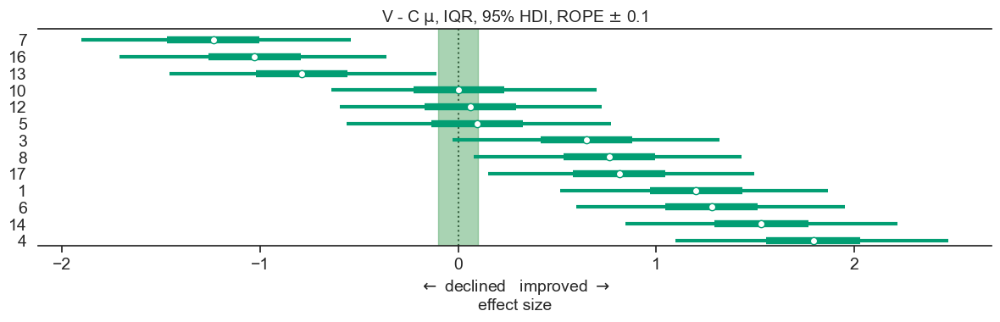

In [45]:
effs_IDs = dict()
for t in IDs:
    effs_IDs[t]= az_effect_size(ID_idata,    df,{'ID':t},{'intervention':['C','V']})    
    
axs = az.plot_forest(sort_dict_by_mean(effs_IDs),
                     hdi_prob=0.95,combined=True,r_hat=False, ess=False,figsize=(12,4),
                     linewidth=3,textsize=14,markersize=8,rope=(-0.1,0.1),
                     colors = [sns_to_hex(sns.color_palette("colorblind")[2])] )
axs[0].set_title('V - C $\mathrm{\mu}$, IQR, 95% HDI, ROPE $\pm$ 0.1',size=14)
axs[0].axvline(x=0,color='k',ls=':',zorder=-1)
axs[0].set_xlabel(r'$\leftarrow$ declined   improved $\rightarrow$'
                  '\n'
                  "effect size",size=14)
plt.gcf().tight_layout()
#plt.savefig('bambi_IDs_es'+'.pdf')
plt.show()

## Bayes Factor, prior probabilities, and single level contrast plots

Effect size of ID 7 contrasting intervention V - C
Computing corrected Hedge's g


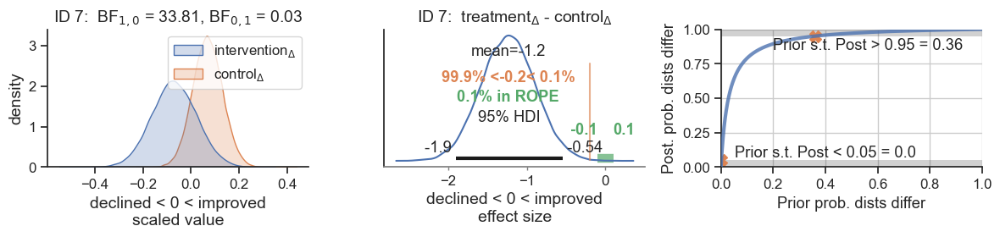

Effect size of ID 16 contrasting intervention V - C
Computing corrected Hedge's g


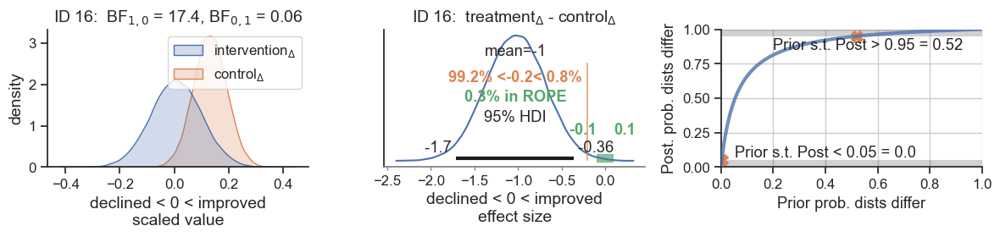

Effect size of ID 13 contrasting intervention V - C
Computing corrected Hedge's g


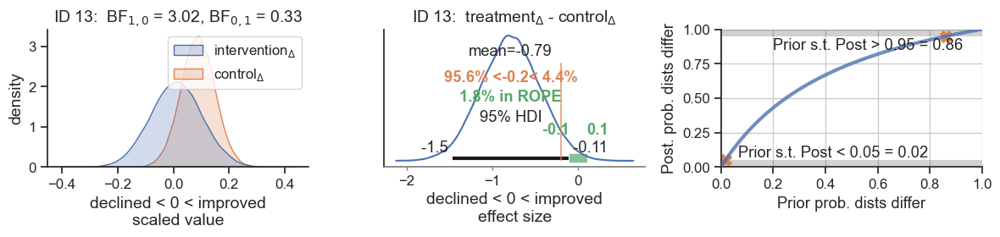

Effect size of ID 10 contrasting intervention V - C
Computing corrected Hedge's g


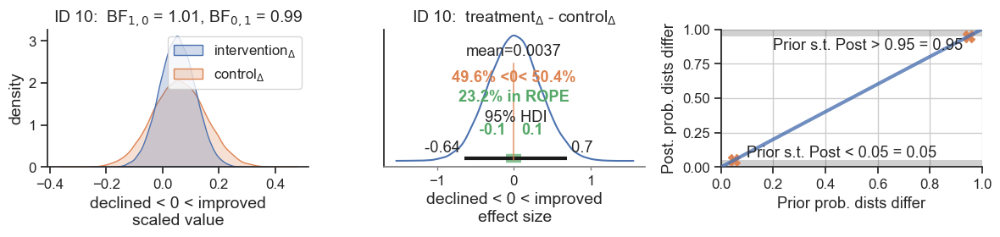

Effect size of ID 12 contrasting intervention V - C
Computing corrected Hedge's g


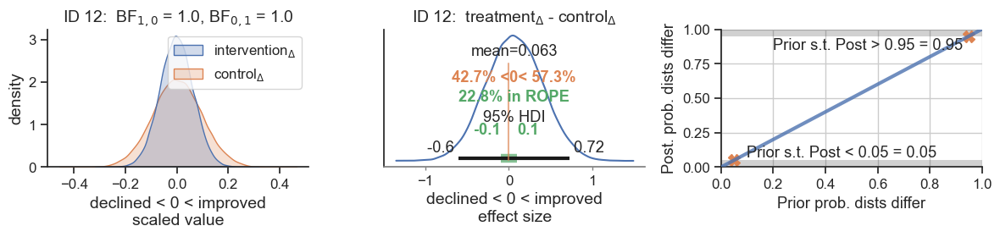

Effect size of ID 5 contrasting intervention V - C
Computing corrected Hedge's g


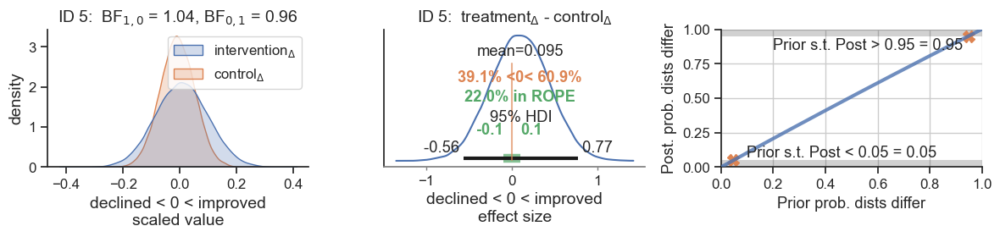

Effect size of ID 3 contrasting intervention V - C
Computing corrected Hedge's g


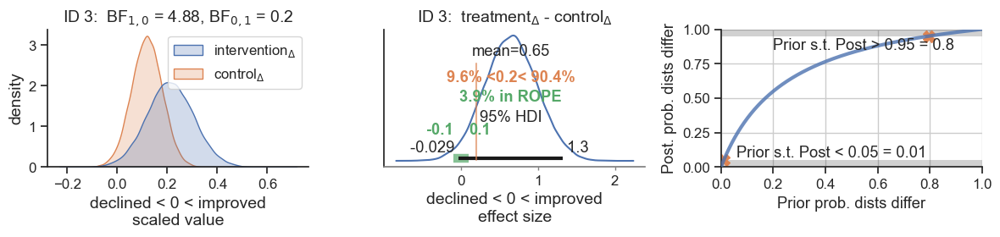

Effect size of ID 8 contrasting intervention V - C
Computing corrected Hedge's g


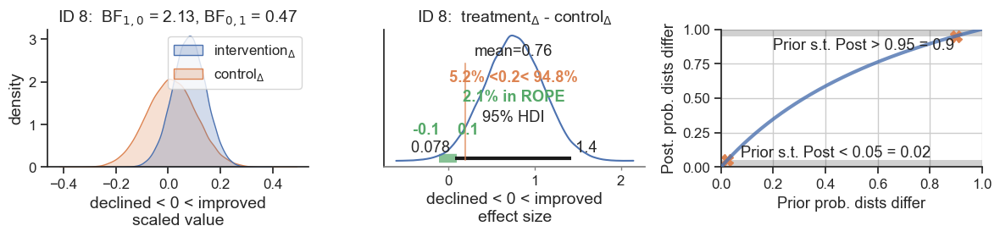

Effect size of ID 17 contrasting intervention V - C
Computing corrected Hedge's g


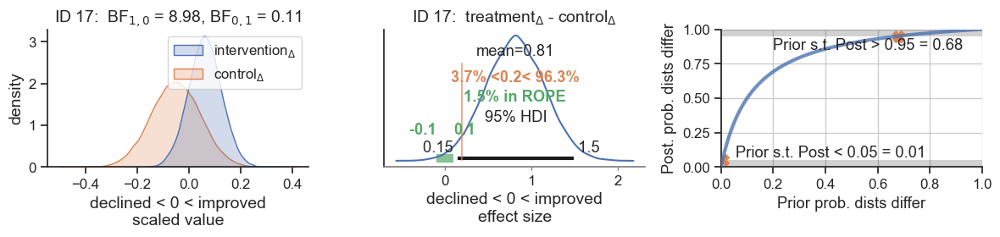

Effect size of ID 1 contrasting intervention V - C
Computing corrected Hedge's g


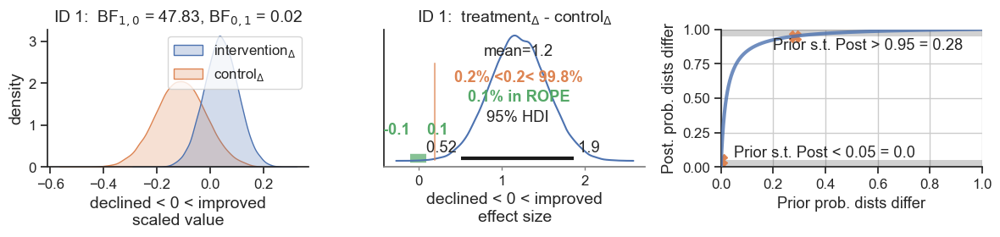

Effect size of ID 6 contrasting intervention V - C
Computing corrected Hedge's g


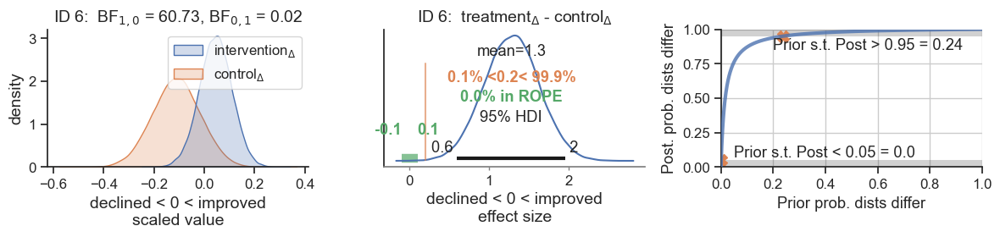

Effect size of ID 14 contrasting intervention V - C
Computing corrected Hedge's g


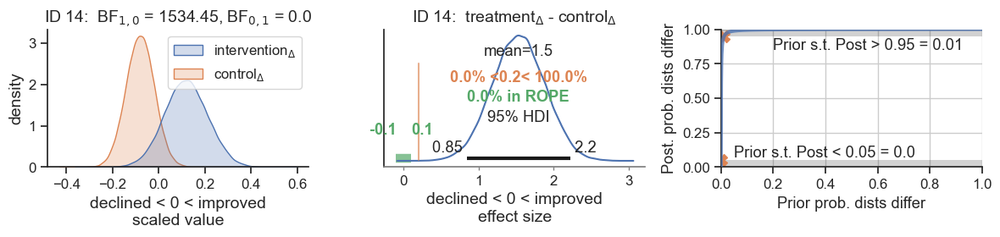

Effect size of ID 4 contrasting intervention V - C
Computing corrected Hedge's g


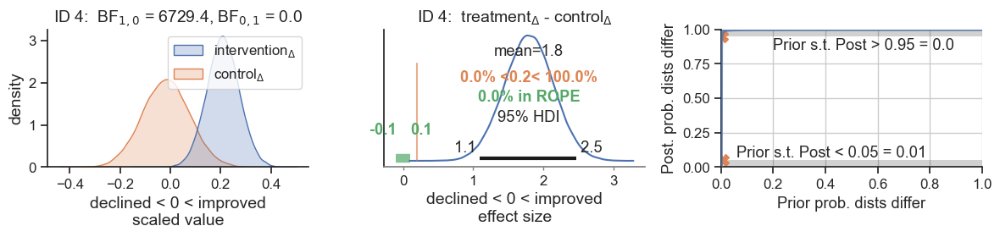

,ID 7 V-C,ID 16 V-C,ID 13 V-C,ID 10 V-C,ID 12 V-C,ID 5 V-C,ID 3 V-C,ID 8 V-C,ID 17 V-C,ID 1 V-C,ID 6 V-C,ID 14 V-C,ID 4 V-C
bf01,0.03,0.06,0.33,0.99,1.00,0.96,0.20,0.47,0.11,0.02,0.02,0.00,0.00
pc_EQ,2.90,5.40,24.90,49.80,50.00,48.90,17.00,31.90,10.00,2.00,1.60,0.10,0.00
neg_pc_large,89.69,74.61,48.69,0.95,0.51,0.52,0.00,0.00,0.00,0.00,0.00,0.00,0.00
neg_pc_medium,8.57,19.31,31.13,6.01,4.19,3.55,0.05,0.01,0.01,0.00,0.00,0.00,0.00
neg_pc_small,1.59,5.26,15.75,20.54,17.37,15.50,0.62,0.28,0.14,0.00,0.00,0.00,0.00
neg_pc_below_small,99.85,99.18,95.57,27.50,22.06,19.58,0.67,0.29,0.15,0.00,0.00,0.00,0.00
pc_in_rope,0.06,0.34,1.83,23.23,22.77,22.01,3.91,2.08,1.53,0.08,0.04,0.01,0.00
hdi95_lower,-1.90,-1.71,-1.46,-0.64,-0.60,-0.56,-0.03,0.08,0.15,0.52,0.60,0.85,1.10
mean,-1.24,-1.03,-0.79,0.00,0.06,0.10,0.65,0.76,0.81,1.20,1.28,1.53,1.79
hdi95_higher,-0.54,-0.36,-0.11,0.70,0.72,0.77,1.32,1.43,1.50,1.87,1.95,2.22,2.48


In [46]:
id_ = IDs[0]
ref_vals = [-0.2,-0.2,-0.2,0,0,0,0.2,0.2,0.2,0.2,0.2,0.2,0.2] # set threshold
for i,id_ in enumerate(IDs):
    vib = (ID_idata.posterior.stack(draws=("chain", "draw"))['ID:intervention']).sel({'ID:intervention_dim':id_+', V'})
    con = (ID_idata.posterior.stack(draws=("chain", "draw"))['ID:intervention']).sel({'ID:intervention_dim':id_+', C'})

    bf_df, effs,bf_pri_prob = az_plot_contrast(idat=ID_idata,df=df,t2="ID "+id_+": ",dim=id_,lvl_h0=id_+', C',lvl_h0_dat=con,lvl_h1=id_+', V',lvl_h1_dat=vib,ref_val=ref_vals[i],mode='IDs',sav_plot_q=False)
    if i == 0:
        summary_ids = summary_stats(bf_df,effs,bf_pri_prob,"ID "+id_+' V-C ')
    else:
        summary_ids=summary_ids.join(summary_stats(bf_df,effs,bf_pri_prob,"ID "+id_+' V-C '))
summary_ids

## ROC Analysis

In [47]:
# Function to get the original data at assessment M0
def get_orig_M0_data(pn,test):    
    if test == 'HealthVAS' or test == 'WT2min':
        return pd.read_csv(pn+test+'_M0_M1_M2_M3_wide.csv',index_col=0).loc[:,["ID","tries","M0"]].M0
    else:
        return pd.read_csv(pn+test+'_M0_M1_M2_M3_wide.csv',index_col=0).loc[:,["ID","tries","M0"]].pivot_table(values='M0',index='ID',columns='tries').reset_index(drop=True)
    
# Function to choose tries randomly (if there is more than one try)
def get_nums(data_dict,param):
    rand_try   = lambda: 'V'+str(np.random.randint(1, high=4, size=1, dtype=int)[0]) # V1, V2, V3 etc.
    if data_dict[param].size > 13:
        return np.array(data_dict[param][rand_try()])
    else:
        return data_dict[param].to_numpy(float)

# Store all M0 data (including all tries) in a dict
data_dict = dict()
params = ['StanceTimeAL','Velocity','TUG','WT2min','StepLengthUL','HealthVAS','FSST'] # ordered by mean score
for param in params:
    data_dict[param] = get_orig_M0_data(pn,param)

In [48]:
# Define random drawing functions from the posterior to get category sequences
IDs = [str(s) for s in np.sort([int(i) for i in IDs])] # ensure that IDs are ordered correctly, assuming the original files list them in ascending order!

th = 0.2 # thereshold the define a responder if the effect > th
n_chains = effs_IDs['1'].shape[0]
n_draws  = effs_IDs['1'].shape[1]

# random draw functions
rand_chain = lambda: np.random.randint(0, high=n_chains, size=1, dtype=int)[0]
rand_draw  = lambda: np.random.randint(0, high=n_draws, size=1, dtype=int)[0]
# randomly select chain and draw per ID from effect sizes and return True if the value > the threshold
get_cats   = lambda: np.array([effs_IDs[id_].sel(chain=rand_chain(),draw=rand_draw()).values > th for id_ in IDs])

### Run ROC

In [49]:
cycles = 15_000 # Number of random draws from the posterior
THs,AUCs,leg,Js = [], [], [], []
roc_df = pd.DataFrame()
# for each test create 'cycles' randomly drawn sequences and perform ROC analysis on each
for param in params:
    print(param)
    for c in range(0,cycles):
        _,_,auc,th_crit,J = myROC(np.array(get_nums(data_dict,param)),np.array(get_cats()),steps=1000)
        AUCs.append(auc)
        THs.append(th_crit)
        Js.append(J)
        leg.append(param)
    roc_df = pd.concat([roc_df, pd.DataFrame({'Measure':leg,'AUC':AUCs,'Threshold':THs,'J':Js}).set_index('Measure')])
print('done')
#roc_df.to_csv('roc_df.csv.gz', compression='gzip')
#print('saved')

StanceTimeAL
Velocity
TUG
WT2min
StepLengthUL
HealthVAS
FSST
done


### Show aggregated results

In [50]:
def hdi_lower(x):
    return az.hdi(x.values,hdi_prob=0.95)[0]
def hdi_upper(x):
    return az.hdi(x.values,hdi_prob=0.95)[1]
roc_df.reset_index().groupby('Measure').agg([hdi_lower,hdi_upper,np.mean,np.std]).sort_values(('AUC','mean'),ascending=False)

AUC                                 Threshold              \
             hdi_lower hdi_upper      mean       std   hdi_lower   hdi_upper   
Measure                                                                        
StanceTimeAL  0.738095  1.000000  0.886812  0.070869    0.581104    0.690208   
Velocity      0.666667  1.000000  0.815919  0.092593    4.830624    5.360854   
TUG           0.523810  0.833333  0.657669  0.085066    4.251020    9.290900   
WT2min        0.523810  0.773810  0.648489  0.064989  167.606550  192.434400   
FSST          0.500000  0.833333  0.642012  0.101287    6.004000    7.892050   
StepLengthUL  0.500000  0.833333  0.624390  0.097003   59.777864   82.586409   
HealthVAS     0.500000  0.680556  0.573641  0.065313   50.555000   90.045000   

                                            J                                
                    mean        std hdi_lower hdi_upper      mean       std  
Measure                                                                      
StanceTimeAL    0.635615   0.039052  0.550000  1.000000  0.770309  0.115406  
Velocity        5.071497   0.223855  0.475000  1.000000  0.681048  0.138290  
TUG             5.635232   1.625758  0.261905  0.666667  0.399658  0.104809  
WT2min        188.078408  11.673298  0.275000  0.638889  0.412516  0.106506  
FSST            6.814180   0.701812  0.214286  0.700000  0.386191  0.145471  
StepLengthUL   69.566746   8.772109  0.238095  0.700000  0.439280  0.123478  
HealthVAS      73.742593  15.130335  0.285714  0.666667  0.443375  0.116762

Thereshold where J > 0.5, which is interpreted as diagnostically relevant (https://www.scalestatistics.com/youden-index.html)

The lower 95% HDI of the threshold corresponds to the threshold at which J > 0.5

In [51]:
# Show the gait speed threshold at J > 0.5
vel_J_gr_pnt5 = (roc_df.loc['Velocity',:]).loc[(roc_df.loc['Velocity','J']>0.5)*(roc_df.loc['Velocity','J']<0.55),:].mean()
vel_J_gr_pnt5.round(2)

AUC          0.80
Threshold    4.81
J            0.52
dtype: float64

In [52]:
# Show the affected leg stance time threshold at J > 0.5
sta_J_gr_pnt5 = (roc_df.loc['StanceTimeAL',:]).loc[(roc_df.loc['StanceTimeAL','J']>0.5)*(roc_df.loc['StanceTimeAL','J']<0.55),:].mean(skipna=True)
sta_J_gr_pnt5.round(2)

AUC          0.71
Threshold    0.65
J            0.54
dtype: float64

In [53]:
all_dat = pd.DataFrame({k:data_dict[k].mean(axis=1) if data_dict[k].size > 13 else data_dict[k] for k in data_dict})
all_dat['mean Effect']=[float(effs_IDs[k].mean().values) for k in effs_IDs.keys()]
all_dat['Class'] = ['R','R','R','U','R','NR','R','U','U','NR','R','NR','R']
all_dat['Velocity'] = all_dat['Velocity']
all_dat['ID'] = IDs
all_dat=all_dat.set_index('ID')
all_dat

,StanceTimeAL,Velocity,TUG,WT2min,StepLengthUL,HealthVAS,FSST,mean Effect,Class
ID,,,,,,,,,
1,0.764333,3.5256,5.123333,186.50,59.549333,95.0,4.770000,-1.236407,R
3,0.745000,3.3072,15.810000,90.00,65.218999,45.0,14.286667,-1.029445,R
4,0.687000,4.2708,6.600000,112.30,67.303332,100.0,6.883333,-0.788313,R
5,0.673000,4.0044,7.113333,167.50,58.064334,95.0,6.926667,0.003689,U
6,0.698000,5.0436,7.236667,189.60,83.247335,92.0,7.006667,0.063128,R
7,0.559333,6.0576,4.410000,210.00,80.102666,75.0,4.923333,0.095406,NR
8,0.716667,4.0452,4.780000,210.00,64.835665,85.5,5.016667,0.647770,R
10,0.570667,4.0740,8.703333,150.00,50.047666,90.0,7.546667,0.762536,U
12,0.626000,5.1888,7.933333,192.30,71.502332,70.0,7.663333,0.812743,U


### Plot Thresholds

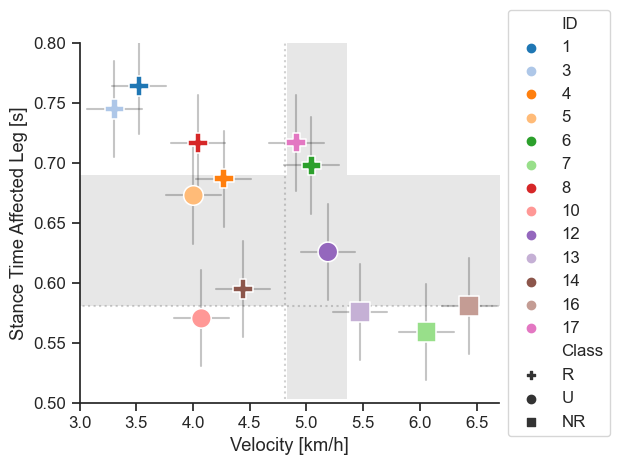

In [54]:
hdi_v = az.hdi(roc_df.loc['Velocity','Threshold'].values,hdi_prob=0.95)
hdi_s = az.hdi(roc_df.loc['StanceTimeAL','Threshold'].values,hdi_prob=0.95)
sem_v = 0.481219 # calculated earlier, see supplement Table 12
sem_s = 0.080050 # calculated earlier, see supplement Table 12

st_min, st_max = all_dat['StanceTimeAL'].min(),all_dat['StanceTimeAL'].max()
v_min, v_max = all_dat['Velocity'].min(),all_dat['Velocity'].max()


plt.fill_between((v_min*0.9,v_max*1.1),(hdi_s[0],hdi_s[0]),(hdi_s[1],hdi_s[1]),alpha=0.1,color='k',zorder=0, linewidth=0.0)
plt.fill_betweenx((st_min*0.9,hdi_s[0]),(hdi_v[0],hdi_v[0]),(hdi_v[1],hdi_v[1]),alpha=0.1,color='k',zorder=0, linewidth=0.0)
plt.fill_betweenx((hdi_s[1],st_max*1.1),(hdi_v[0],hdi_v[0]),(hdi_v[1],hdi_v[1]),alpha=0.1,color='k',zorder=0, linewidth=0.0)
plt.plot((vel_J_gr_pnt5,vel_J_gr_pnt5),(st_min*0.9,st_max*1.1),'k:',alpha=0.2)
plt.plot((v_min*0.9,v_max*1.1),(hdi_s[0],hdi_s[0]),'k:',alpha=0.2)

s = sns.scatterplot(data=all_dat,x='Velocity',y='StanceTimeAL',hue='ID',style='Class',markers=['P','o','s'],
                palette='tab20',zorder=100,s=200)

s.set_xlabel('Velocity [km/h]')
s.set_ylabel('Stance Time Affected Leg [s]')
#col = matplotlib.cm.get_cmap('tab10')(i)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
for x,y in zip(all_dat['Velocity'],all_dat['StanceTimeAL']):
    s.plot([x+sem_v/2,x-sem_v/2],[y,y],'k-',alpha=0.25)
    s.plot([x,x],[y+sem_s/2,y-sem_s/2],'k-',alpha=0.25)
    
sns.despine(right=True, top=True)
plt.xlim((3, 6.7))
plt.ylim((0.5, 0.8))
plt.gcf().tight_layout()
#plt.savefig('classification'+'.pdf')
plt.show()

## Prior ond Posterior Predictive check

plotting ... ax 0,0 - ID 1 : intervention V - prior
plotting ... ax 0,1 - ID 1 : intervention V - posterior
plotting ... ax 1,0 - ID 1 : intervention C - prior
plotting ... ax 1,1 - ID 1 : intervention C - posterior
plotting ... ax 2,0 - ID 3 : intervention V - prior
plotting ... ax 2,1 - ID 3 : intervention V - posterior
plotting ... ax 3,0 - ID 3 : intervention C - prior
plotting ... ax 3,1 - ID 3 : intervention C - posterior
plotting ... ax 4,0 - ID 4 : intervention V - prior
plotting ... ax 4,1 - ID 4 : intervention V - posterior
plotting ... ax 5,0 - ID 4 : intervention C - prior
plotting ... ax 5,1 - ID 4 : intervention C - posterior
plotting ... ax 6,0 - ID 5 : intervention V - prior
plotting ... ax 6,1 - ID 5 : intervention V - posterior
plotting ... ax 7,0 - ID 5 : intervention C - prior
plotting ... ax 7,1 - ID 5 : intervention C - posterior
plotting ... ax 8,0 - ID 6 : intervention V - prior
plotting ... ax 8,1 - ID 6 : intervention V - posterior
plotting ... ax 9,0 - ID 6 :

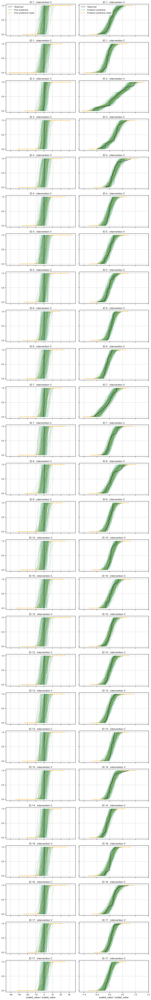

In [55]:
fig,axs = ppc_bambi(ID_idata,
                    df = df,
                    var_names=['ID'],
                    subset='intervention',
                    n_pp_samp = 200
                   )
#plt.savefig('bambi_ID_treat_ppc'+'.png')
plt.show()

# Plot Custom Priors

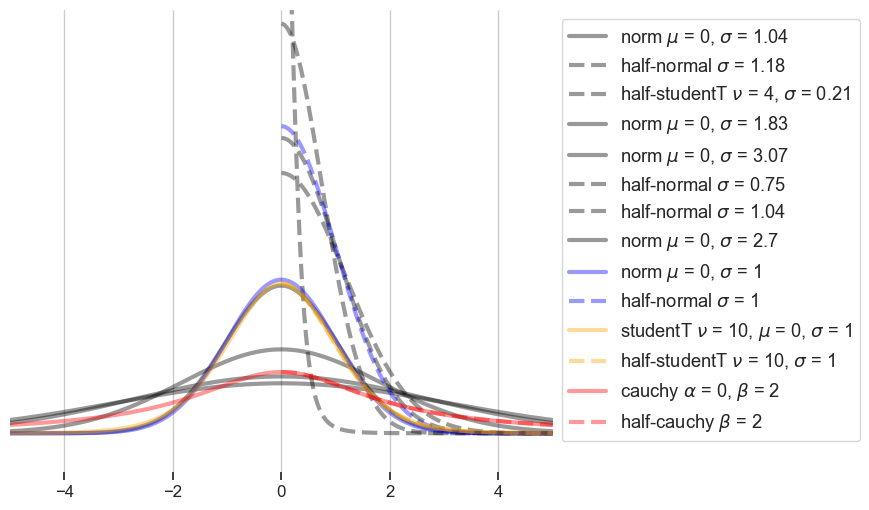

In [56]:
plt.subplots(1,1,figsize=(7,6))
sns.set(font_scale=1.2)
sns.set_style("white",{'axes.linewidth': 0.3})
plt.rcParams['xtick.bottom'] = True
plt.rcParams['ytick.left'] = True
x = np.linspace(-5, 5, 1000)
# default
c = 'black'
mu, sigma = 0, 1.04
plt.plot(x, stats.norm.pdf(x, mu, sigma), color=c, label=r'norm $\mu$ = {}, $\sigma$ = {}'.format(mu, sigma),alpha=0.4,linewidth=3)
mu, sigma = 0, 1.18
plt.plot(x[x>=0], stats.halfnorm.pdf(x[x>=0], scale=sigma), '--', color=c, label=r'half-normal $\sigma$ = {}'.format(sigma),alpha=0.4,linewidth=3)
nu, sigma = 4, 0.21
plt.plot(x[x>=0], stats.t.pdf(x[x>=0], df=nu, loc=0, scale=sigma), '--', color=c, label=r'half-studentT $\nu$ = {}, $\sigma$ = {}'.format(nu,sigma),alpha=0.4,linewidth=3)
mu, sigma = 0, 1.83
plt.plot(x, stats.norm.pdf(x, mu, sigma), color=c, label=r'norm $\mu$ = {}, $\sigma$ = {}'.format(mu, sigma),alpha=0.4,linewidth=3)
mu, sigma = 0, 3.07
plt.plot(x, stats.norm.pdf(x, mu, sigma), color=c, label=r'norm $\mu$ = {}, $\sigma$ = {}'.format(mu, sigma),alpha=0.4,linewidth=3)
mu, sigma = 0, 0.75
plt.plot(x[x>=0], stats.halfnorm.pdf(x[x>=0], scale=sigma), '--', color=c, label=r'half-normal $\sigma$ = {}'.format(sigma),alpha=0.4,linewidth=3)
mu, sigma = 0, 1.04
plt.plot(x[x>=0], stats.halfnorm.pdf(x[x>=0], scale=sigma), '--', color=c, label=r'half-normal $\sigma$ = {}'.format(sigma),alpha=0.4,linewidth=3)
mu, sigma = 0, 2.7
plt.plot(x, stats.norm.pdf(x, mu, sigma), color=c, label=r'norm $\mu$ = {}, $\sigma$ = {}'.format(mu, sigma),alpha=0.4,linewidth=3)
# normal
c = 'blue'
mu, sigma = 0, 1
plt.plot(x, stats.norm.pdf(x, mu, sigma), color=c, label=r'norm $\mu$ = {}, $\sigma$ = {}'.format(mu, sigma),alpha=0.4,linewidth=3)
plt.plot(x[x>=0], stats.halfnorm.pdf(x[x>=0], scale=sigma), '--', color=c, label=r'half-normal $\sigma$ = {}'.format(sigma),alpha=0.4,linewidth=3)
# studentT
c = 'orange'
mu, nu, sigma = 0, 10, 1
plt.plot(x, stats.t.pdf(x, nu, loc=mu, scale=sigma), color=c, label=r'studentT $\nu$ = {}, $\mu$ = {}, $\sigma$ = {}'.format(nu, mu, sigma),alpha=0.4,linewidth=3)
plt.plot(x[x>=0], stats.t.pdf(x[x>=0], df=nu, loc=0, scale=sigma), '--', color=c, label=r'half-studentT $\nu$ = {}, $\sigma$ = {}'.format(nu,sigma),alpha=0.4,linewidth=3)
# cauchy
c = 'red'
a, b = 0, 2
plt.plot(x, stats.cauchy.pdf(x, loc=a, scale=b), color=c, label=r'cauchy $\alpha$ = {}, $\beta$ = {}'.format(a, b),alpha=0.4,linewidth=3)
plt.plot(x[x>=0], stats.cauchy.pdf(x[x>=0], scale=b), '--', color=c, label=r'half-cauchy $\beta$ = {}'.format(b),alpha=0.4,linewidth=3)
plt.xlim(-5,5)
plt.ylim(-0.1,1.1)
plt.yticks([])
plt.grid()
sns.despine(right=True, top=True,left=True,bottom=True)
plt.legend(bbox_to_anchor=(1,1), loc="upper left")
#plt.savefig('priors.pdf',bbox_inches='tight')
plt.show()

# Session info

In [57]:
%reload_ext watermark
%watermark -n -u -v -iv -w

Last updated: Wed Feb 08 2023

Python implementation: CPython
Python version       : 3.11.0
IPython version      : 8.7.0

seaborn   : 0.12.1
httpimport: 1.3.0
pandas    : 1.5.2
pymc      : 4.4.0
scipy     : 1.9.3
matplotlib: 3.6.2
numpy     : 1.23.5
bambi     : 0.9.1
arviz     : 0.14.0

Watermark: 2.3.1

